# import library

In [181]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR  # for Regression
from lightgbm import LGBMRegressor
from IPython.display import display

### 📦 Libraries Used

- **NumPy** – numerical computations
- **Pandas** – data manipulation and analysis
- **Matplotlib & Seaborn** – data visualization
- **Plotly Express** – interactive visualizations
- **Scikit-learn** – preprocessing, pipelines, model training & evaluation
  - Linear, Lasso, Ridge, ElasticNet
  - KNN, Decision Tree, Random Forest, SVR
  - StandardScaler, Pipeline, RandomizedSearchCV
- **LightGBM** – gradient boosting regressor for high-performance modeling

In [182]:
def read_data(path) -> pd.DataFrame:
    d = pd.read_csv(path)
    return d

In [183]:
data = read_data(path=r"B:\AI Source\Projects\list_of_projects\پروژه های تمرینی\medical-Insurance-EDA-and-Prediction\Data\medical_insurance.csv")

In [184]:
df = pd.DataFrame(data)

In [185]:
df

,age,gender,bmi,children,discount_eligibility,region,expenses,premium
0,19,female,27.9,0,yes,southwest,16884.92,168.8492
1,18,male,33.8,1,no,southeast,1725.55,17.2555
2,28,male,33.0,3,no,southeast,4449.46,44.4946
3,33,male,22.7,0,no,northwest,21984.47,439.6894
4,32,male,28.9,0,no,northwest,3866.86,77.3372
...,...,...,...,...,...,...,...,...
1333,50,male,31.0,3,no,northwest,10600.55,212.0110
1334,18,female,31.9,0,no,northeast,2205.98,22.0598
1335,18,female,36.9,0,no,southeast,1629.83,16.2983
1336,21,female,25.8,0,no,southwest,2007.95,20.0795


In [186]:
def shape(data:pd.DataFrame):
    print(f"row --> {df.shape[0]}")
    print(f"columns --> {df.shape[1]}")

In [187]:
shape(df)

row --> 1338
columns --> 8


In [188]:
def information(data: pd.DataFrame):
    print(data.info())
    print("_" * 80)
    df_missing_value = pd.DataFrame(
        data={
            "count missing value": data.isna().sum(),
            "Ratio of missing values ​​to total data": (df.isna().any(axis=1).sum())
            / len(df),
            "Percentage of missing values ​​to total data": (
                (df.isna().any(axis=1).sum()) / len(df)
            )
            * 100,
        }
    )
    display(df_missing_value)
    print("_" * 100)
    print(f"unique value in each columns:\n")
    for colmn in df.columns:
        print(f"unique value in {colmn}:\n{df[colmn].unique()}")
        print("_" * 80)

In [189]:
information(df)

<class 'pandas.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   1338 non-null   int64  
 1   gender                1338 non-null   str    
 2   bmi                   1338 non-null   float64
 3   children              1338 non-null   int64  
 4   discount_eligibility  1338 non-null   str    
 5   region                1338 non-null   str    
 6   expenses              1338 non-null   float64
 7   premium               1338 non-null   float64
dtypes: float64(3), int64(2), str(3)
memory usage: 104.9 KB
None
________________________________________________________________________________


,count missing value,Ratio of missing values ​​to total data,Percentage of missing values ​​to total data
age,0,0.0,0.0
gender,0,0.0,0.0
bmi,0,0.0,0.0
children,0,0.0,0.0
discount_eligibility,0,0.0,0.0
region,0,0.0,0.0
expenses,0,0.0,0.0
premium,0,0.0,0.0


____________________________________________________________________________________________________
unique value in each columns:

unique value in age:
[19 18 28 33 32 31 46 37 60 25 62 23 56 27 52 30 34 59 63 55 22 26 35 24
 41 38 36 21 48 40 58 53 43 64 20 61 44 57 29 45 54 49 47 51 42 50 39]
________________________________________________________________________________
unique value in gender:
<ArrowStringArray>
['female', 'male']
Length: 2, dtype: str
________________________________________________________________________________
unique value in bmi:
[27.9 33.8 33.  22.7 28.9 25.7 33.4 27.7 29.8 25.8 26.2 26.3 34.4 39.8
 42.1 24.6 30.8 23.8 40.3 35.3 36.  32.4 34.1 31.9 28.  23.1 32.8 17.4
 36.3 35.6 28.6 28.3 36.4 20.4 20.8 36.7 39.9 26.6 36.6 21.8 37.1 37.3
 38.7 34.8 24.5 35.2 33.6 28.7 37.  31.8 31.7 22.9 27.4 33.7 24.7 25.9
 22.4 39.1 36.2 24.  24.8 28.5 28.1 32.  34.  29.6 35.5 26.9 38.3 37.6
 41.2 31.2 27.2 27.  39.5 31.3 20.  19.3 31.6 25.5 30.1 29.9 27.5 28.4
 30.9 35.1

### ✅ Summery
---
- There was no missing value
- There were no wrong values
- The column data type was also correct
---

**Note**:
I divide EDA into 3 parts
Because we have 2 targets:
1. Part 1:
Initial EDA including data distribution analysis, noise analysis, outlier analysis, etc.
2. Part 2:
Investigation of the impact of each column on the first target
3. Part 3:
Investigation of the impact of each column on the second target

## Part 1:
---
Initial EDA including data distribution analysis, noise analysis, outlier analysis, etc.

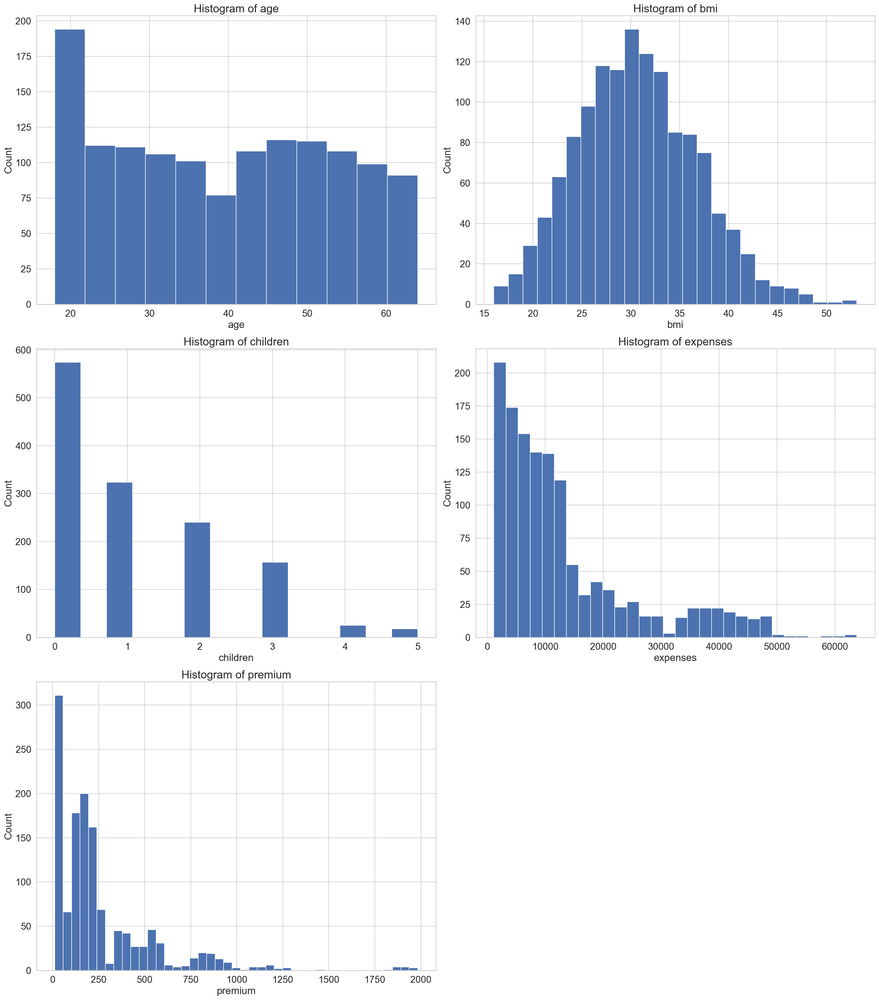

In [190]:
df_num = df.select_dtypes(include="number")

sns.set_theme(style="whitegrid", context="notebook")
fig, axes = plt.subplots(
    nrows=3,
    ncols=2,
    figsize=(22, 25),
    dpi=150
)

axes = axes.flatten()

for ax, col in zip(axes, df_num.columns):
    sns.histplot(df_num[col], bins="auto", ax=ax, alpha=1)
    ax.set_title(f"Histogram of {col}", fontsize=20)
    ax.set_xlabel(col, fontsize=18)
    ax.set_ylabel("Count", fontsize=18)
    ax.tick_params(axis="both", labelsize=17)

for ax in axes[len(df_num.columns):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


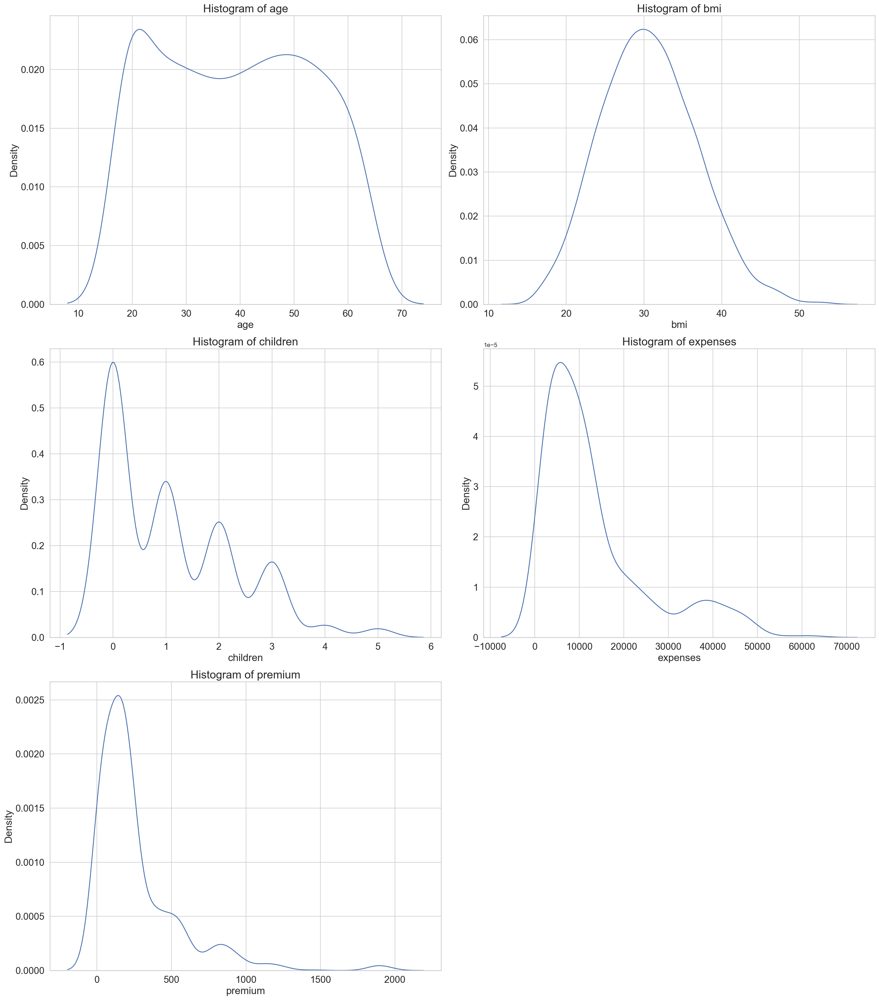

In [191]:


sns.set_theme(style="whitegrid", context="notebook")
fig, axes = plt.subplots(
    nrows=3,
    ncols=2,
    figsize=(22, 25),
    dpi=150
)

axes = axes.flatten()

for ax, col in zip(axes, df_num.columns):
    sns.kdeplot(df_num[col], ax=ax, alpha=1)
    ax.set_title(f"Histogram of {col}", fontsize=20)
    ax.set_xlabel(col, fontsize=18)
    ax.set_ylabel("Density", fontsize=18)
    ax.tick_params(axis="both", labelsize=17)

for ax in axes[len(df_num.columns):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


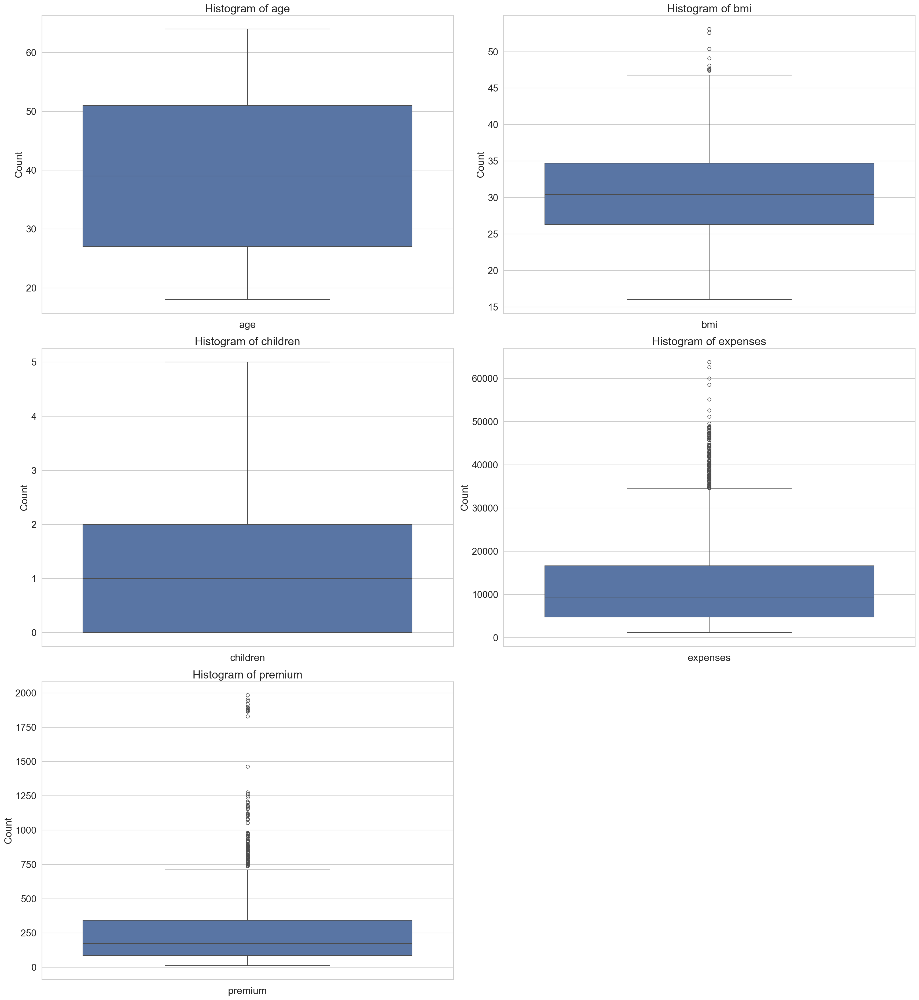

In [192]:

sns.set_theme(style="whitegrid", context="notebook")
fig, axes = plt.subplots(
    nrows=3,
    ncols=2,
    figsize=(23, 25),
    dpi=150
)

axes = axes.flatten()

for ax, col in zip(axes, df_num.columns):
    sns.boxplot(df_num[col], ax=ax)
    ax.set_title(f"Histogram of {col}", fontsize=20)
    ax.set_xlabel(col, fontsize=18)
    ax.set_ylabel("Count", fontsize=18)
    ax.tick_params(axis="both", labelsize=17)

for ax in axes[len(df_num.columns):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


### ☑️ **Summary**
---
**Histograms, box plots, and kdeplot plots of numerical columns showed that:**<br>
1. age:<br>
    - The data distribution is skewed to the right.
    - It is concentrated at the age of 20.
    - It is uniform at the rest of the ages in the graph.
    - This means that most of the people in this data are 20 years old.
    - No noise or outliers are seen.
---
2. bmi:<br>
    - The data distribution is normal.
    - The data is concentrated between 25 and 35 BMI.
    - This means that most people are in the overweight to obese range.
    - Outliers are visible (further analysis in the following graphs).
---
3. childern:<br>
    - The data distribution is skewed to the right.
    - The data is concentrated between 0 and 3 children.
    - This means that most people have no children (or are single) or have 1 to 3 children.
    - Some people have 5 or more children.
    - There are no outliers or noise in the data.
---
4. expenses:<br>
    - The data distribution is skewed to the right.
    - The data is concentrated between $0 and $20,000.
    - This means that most people have typical medical expenses.
    - Some people have $20,000 or more, which means they probably had a specific illness or major surgery, expensive medications.
    - There are outliers.
---
5. premium:
   - The data distribution is skewed to the right.
    - The data is concentrated between $0 and $250.
    - This means that most people pay a small premium.
    - Some people pay $1,000 or more, which means that it is likely influenced by smoking, region, age, and other variables (for example, people with a high BMI pay more premiums).
    - There are outliers.

**Note:**<br>

---
| Column     | Meaning                 | Who pays                    | For what         |
| ---------- | ----------------------- | --------------------------- | ---------------- |
| `premium`  | Insurance premium       | Insured (customer)          | Health coverage  |
| `expenses` | Actual medical expenses | Insurance company / patient | Medical services |


## Part 2:

Investigation of the impact of each column on the first target

---
**I will first categorize the first target values ​​(expenses),<br>
draw histogram charts and show the impact of each first target on each chart**

In [193]:
df["expenses_Level"] = pd.cut(
    x=df["expenses"],
    bins=[0, 5000, 15000, 30000, np.inf],
    labels=["Low", "Medium", "High", "Very High"],
)

Based on my Google searches:
- low expenses: The actual cost of treatment is small(0 to 5000)
- Medium expenses: The actual cost of treatment is Medium(5000 to 15000)
- High expenses: The actual cost of treatment is High(15000 to 30000)
- Very High expenses: The actual cost of treatment is High(>30000)
---
Link to further study: Classification of the actual cost of treatment:<br>
[healthcare.gov](https://www.healthcare.gov)

#### age

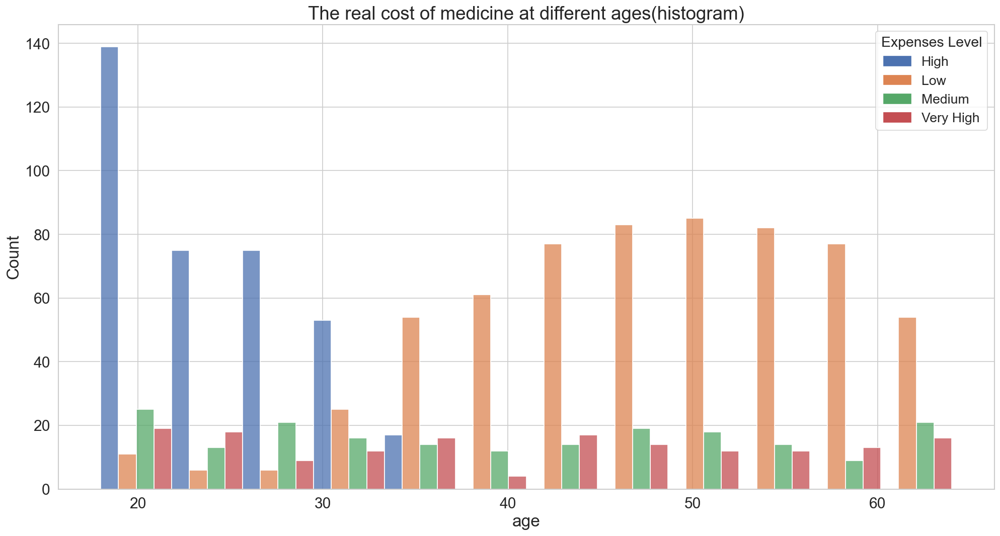

In [194]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.histplot(
    data=df,
    x="age",
    hue="expenses_Level",
    multiple="dodge",
    fill=True,
    bins="auto",
    legend=True,
)
plt.title(label="The real cost of medicine at different ages(histogram)", fontsize=22)
plt.xlabel(xlabel="age", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="Expenses Level", fontsize=16, title_fontsize=17)
plt.show()

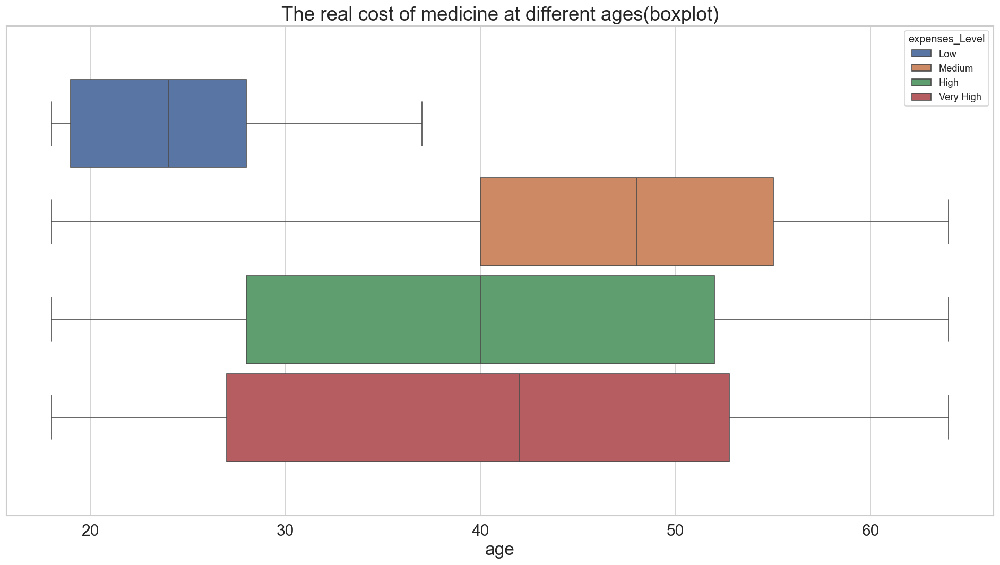

In [195]:
plt.figure(figsize=(20, 10), dpi=120)
sns.boxplot(data=df, x="age", hue="expenses_Level", gap=0.1)
plt.title(label="The real cost of medicine at different ages(boxplot)", fontsize=22)
plt.xlabel(xlabel="age", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
plt.show()

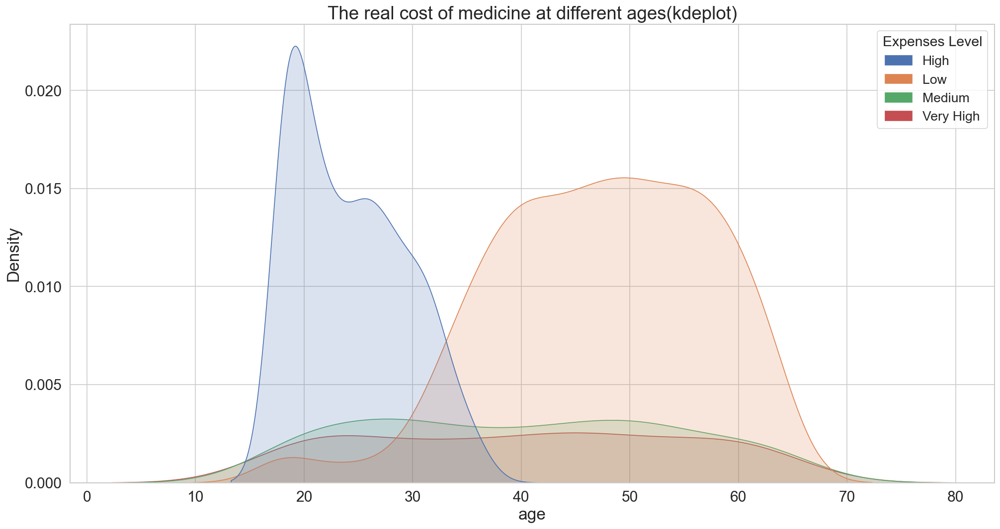

In [196]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.kdeplot(
    data=df,
    x="age",
    hue="expenses_Level",
    legend=True,
    fill=True,
    alpha=0.2,
)
plt.title(label="The real cost of medicine at different ages(kdeplot)", fontsize=22)
plt.xlabel(xlabel="age", fontsize=20)
plt.ylabel(ylabel="Density", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="Expenses Level", fontsize=16, title_fontsize=17)
plt.show()

### ☑️ Summary

---

In analyzing 3 charts, we found that:

- At younger ages between 18 and 30:
    - Actual medical costs are low, because they are healthier, have fewer specific and chronic illnesses, and take fewer medications.
- Between the ages of 30 and 40:
    - The actual cost of treatment (low) decreases and the medium begins to grow. This is because at this age, diseases such as blood pressure, blood sugar, more medical visits, and the cost of medication also increases.
- At ages 45 and up:
    - The actual cost of treating Medium reaches its maximum and High, Very High begin to show themselves, this is because in this middle to old age, they have high drug costs, their average drug consumption is on the rise.

---

**Note:**<br>
Across all ages, high, Very High is seen
This can have various reasons such as: major surgery or procedures, expensive medications, events such as: a person having an accident or an unfortunate event that caused physical injuries that increased the actual cost of treatment.

#### bmi

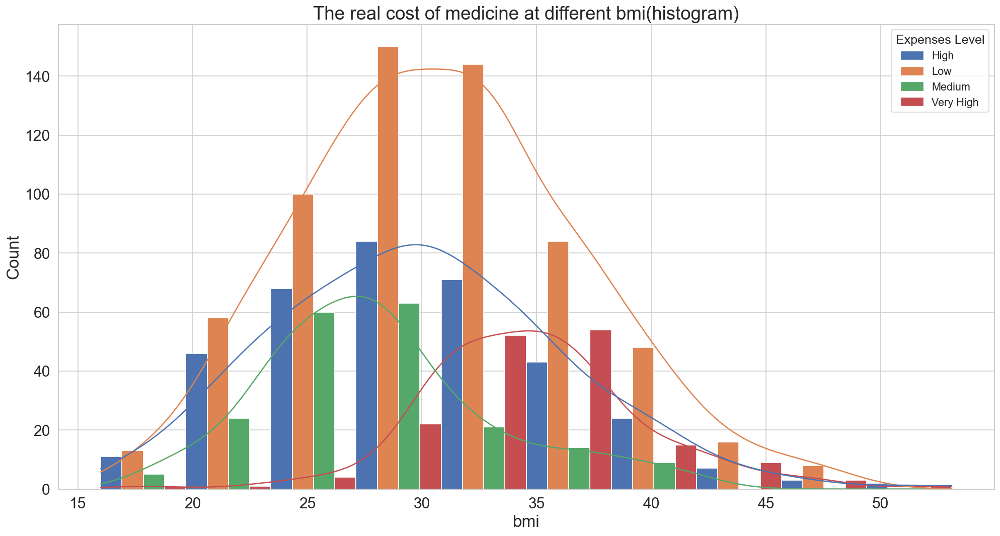

In [197]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.histplot(
    data=df,
    x="bmi",
    hue="expenses_Level",
    fill=True,
    multiple="dodge",
    bins=10,
    legend=True,
    alpha=1,
    kde=True
)
plt.title(label="The real cost of medicine at different bmi(histogram)", fontsize=22)
plt.xlabel(xlabel="bmi", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="Expenses Level", fontsize=13, title_fontsize=15)
plt.show()

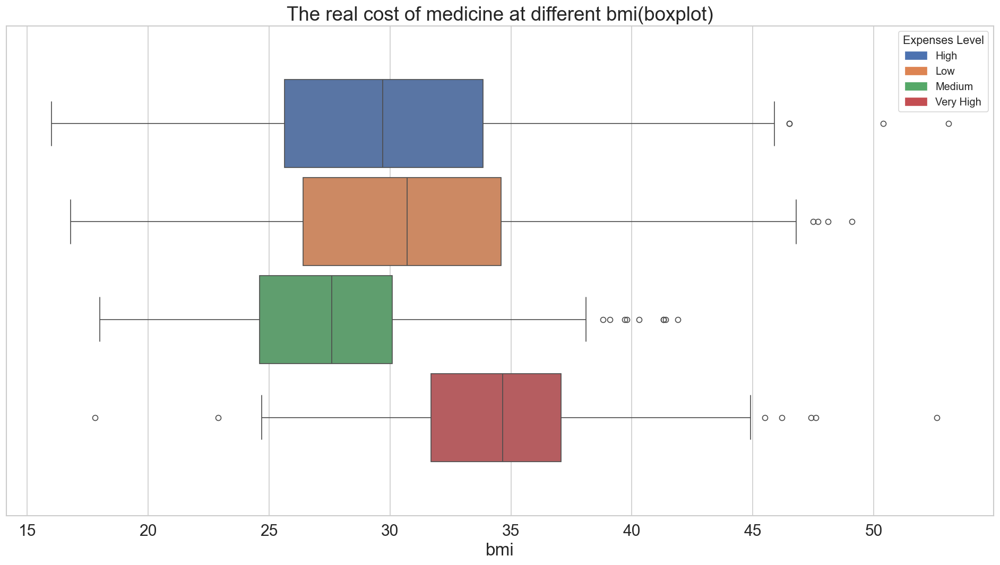

In [198]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.boxplot(data=df, x="bmi", hue="expenses_Level", gap=0.1)
plt.title(label="The real cost of medicine at different bmi(boxplot)", fontsize=22)
plt.xlabel(xlabel="bmi", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]
ax.legend(handles, levels, title="Expenses Level", fontsize=12, title_fontsize=13)
plt.show()

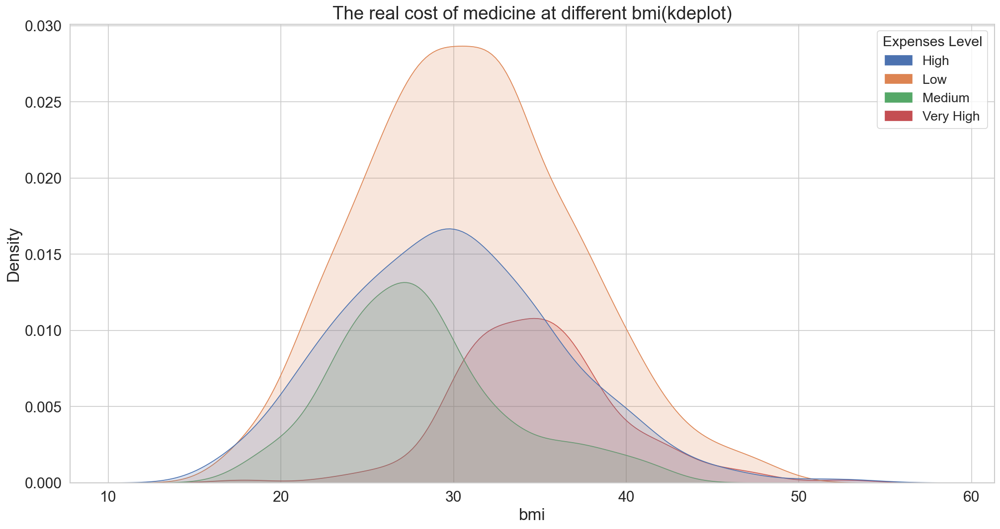

In [199]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.kdeplot(
    data=df,
    x="bmi",
    hue="expenses_Level",
    legend=True,
    fill=True,
    alpha=0.2,
)
plt.title(label="The real cost of medicine at different bmi(kdeplot)", fontsize=22)
plt.xlabel(xlabel="bmi", fontsize=20)
plt.ylabel(ylabel="Density", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="Expenses Level", fontsize=16, title_fontsize=17)
plt.show()

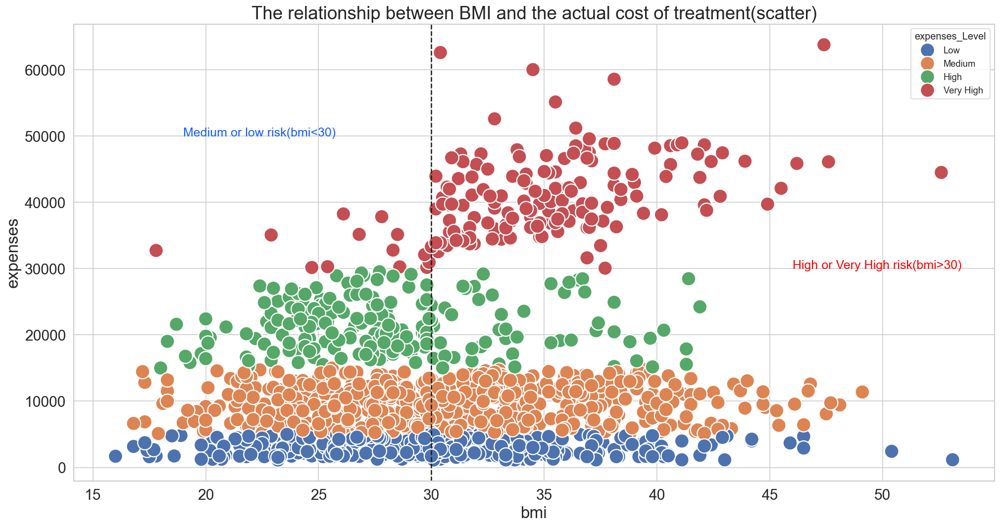

In [200]:
plt.figure(figsize=(20, 10), dpi=120)
sns.scatterplot(data=df, x="bmi", y="expenses", hue="expenses_Level", s=300)
plt.title(
    label="The relationship between BMI and the actual cost of treatment(scatter)", fontsize=22
)
plt.xlabel(xlabel="bmi", fontsize=20)
plt.ylabel(ylabel="expenses", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]
plt.axvline(x=30, color="#1C1917", linestyle="--")
plt.text(x=19, y=50000, s="Medium or low risk(bmi<30)", color="#155DFC", fontsize=15)
plt.text(x=46, y=30000, s="High or Very High risk(bmi>30)", color="#FB0000", fontsize=15)
ax.legend(handles, levels, title="Expenses Level", fontsize=18, title_fontsize=20)
plt.show()

### ☑️ Summary

---

- Big Picture:<br>
📌 As BMI increases, the likelihood of high medical expenses increases<br>
📌 At low BMIs, most people have Low/Medium expenses<br>
📌 At high BMIs, the distribution shifts towards High and Very High<br>
This means:<br>
BMI is an important and influential feature on Medical Expenses.
---
- Analyze each cost level separately:
    1. Low Expenses:
        - The highest density is between 25 and 32
        - Normal distribution
        - Even at high BMIs, the cost is still low
        - High BMI does not necessarily mean high cost, but the overall pattern is different
        - It is seen in the low outlier group
    
    2. Medium Expenses:
        - Focus on BMI ≈ 23 to 30
        - Slight shift towards higher BMI than Low
        - Severe drop after BMI ≈ 35
    3. High Expenses:
        - Main peak at BMI ≈ 28 to 35
        - Compared to Low and Medium:
            - Higher mean BMI
            - Stronger right tail

        📌 Sign of positive relationship between BMI and medical costs
    4. Very High Expenses:
        - Approximately from BMI ≈ 30 and above
        - Highest density between 33 and 40
        - A completely right-skewed distribution

        **⚠️ Important note:**<br>
        People with high BMIs are at the highest risk of very high medical costs.
---
**⚠️ Important note:**<br>
BMI alone is not sufficient to predict cost

#### gender

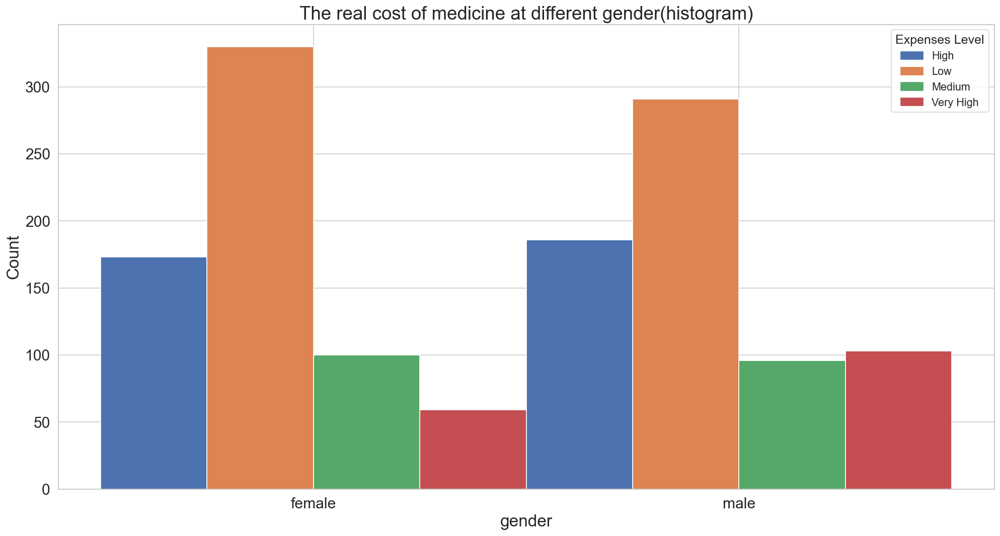

In [201]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.histplot(
    data=df,
    x="gender",
    hue="expenses_Level",
    fill=True,
    multiple="dodge",
    bins=10,
    legend=True,
    alpha=1,
)
plt.title(label="The real cost of medicine at different gender(histogram)", fontsize=22)
plt.xlabel(xlabel="gender", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="Expenses Level", fontsize=13, title_fontsize=15)
plt.show()

In [202]:
counts = df.groupby(["gender", "expenses_Level"]).size()
counts

gender  expenses_Level
female  Low               173
        Medium            330
        High              100
        Very High          59
male    Low               186
        Medium            291
        High               96
        Very High         103
dtype: int64

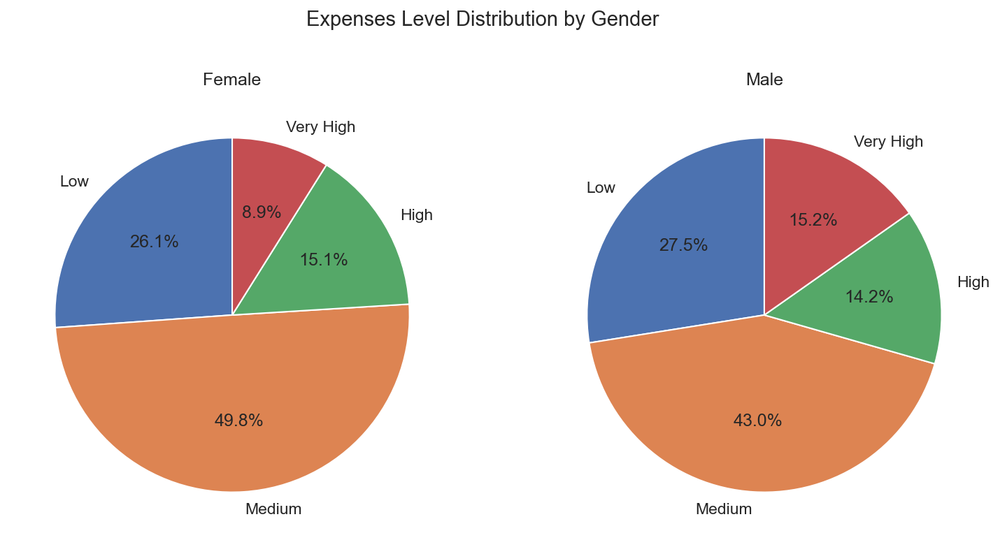

In [203]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=150)

axes[0].pie(
    counts["female"],
    labels=counts["female"].index,
    autopct="%1.1f%%",
    startangle=90
)
axes[0].set_title("Female")

axes[1].pie(
    counts["male"],
    labels=counts["male"].index,
    autopct="%1.1f%%",
    startangle=90
)
axes[1].set_title("Male")

plt.suptitle("Expenses Level Distribution by Gender", fontsize=14)
plt.show()


### ☑️ Summary
📌 Men contribute more to higher medical costs than women.


#### children

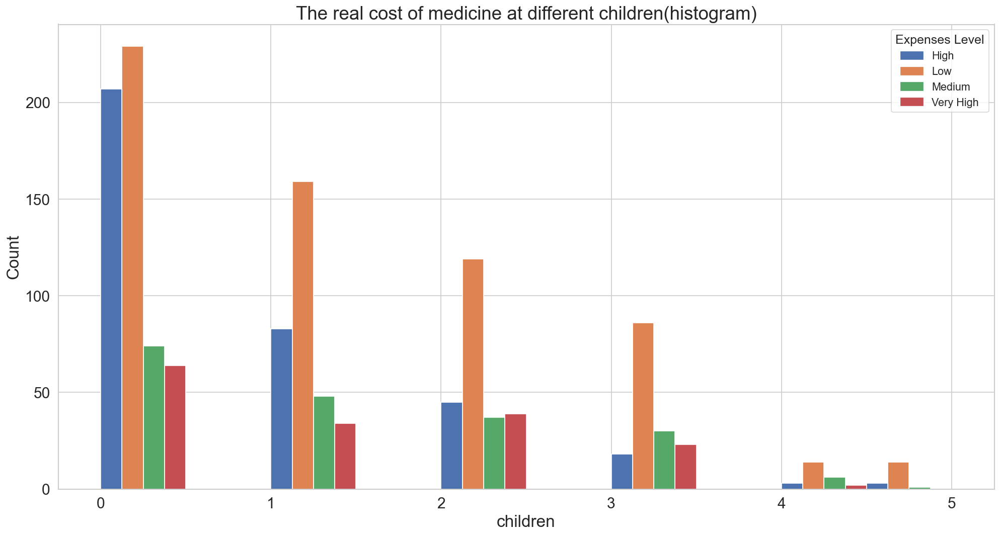

In [204]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.histplot(
    data=df,
    x="children",
    hue="expenses_Level",
    fill=True,
    multiple="dodge",
    bins=10,
    legend=True,
    alpha=1,
)
plt.title(label="The real cost of medicine at different children(histogram)", fontsize=22)
plt.xlabel(xlabel="children", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="Expenses Level", fontsize=13, title_fontsize=15)
plt.show()

In [205]:
counts_children = df.groupby(["children", "expenses_Level"]).size()
counts_children

children  expenses_Level
0         Low               207
          Medium            229
          High               74
          Very High          64
1         Low                83
          Medium            159
          High               48
          Very High          34
2         Low                45
          Medium            119
          High               37
          Very High          39
3         Low                18
          Medium             86
          High               30
          Very High          23
4         Low                 3
          Medium             14
          High                6
          Very High           2
5         Low                 3
          Medium             14
          High                1
dtype: int64

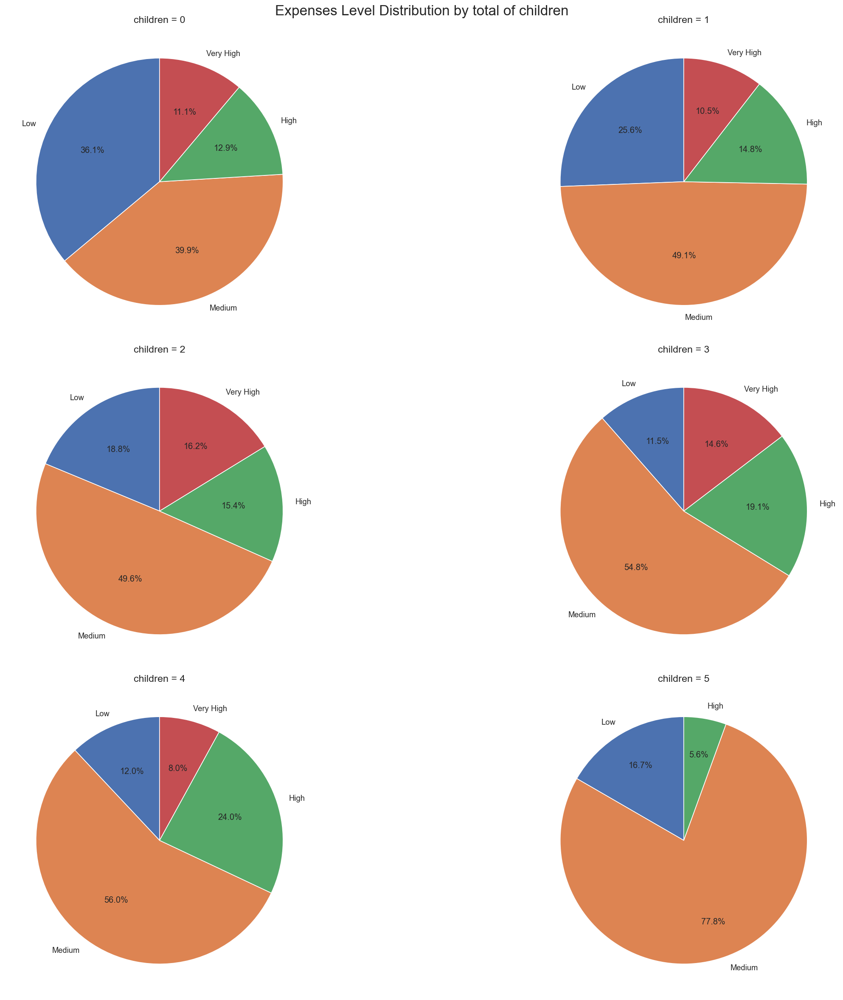

In [206]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20), dpi=120)

axes[0, 0].pie(
    counts_children.loc[0],
    labels=counts_children.loc[0].index,
    autopct="%1.1f%%",
    startangle=90,
)
axes[0, 0].set_title("children = 0", fontsize=14)

axes[0, 1].pie(
    counts_children.loc[1],
    labels=counts_children.loc[1].index,
    autopct="%1.1f%%",
    startangle=90,
)
axes[0, 1].set_title("children = 1", fontsize=14)

axes[1, 0].pie(
    counts_children.loc[2],
    labels=counts_children.loc[2].index,
    autopct="%1.1f%%",
    startangle=90,
)
axes[1, 0].set_title("children = 2", fontsize=14)

axes[1, 1].pie(
    counts_children.loc[3],
    labels=counts_children.loc[3].index,
    autopct="%1.1f%%",
    startangle=90,
)
axes[1, 1].set_title("children = 3", fontsize=14)

axes[2, 0].pie(
    counts_children.loc[4],
    labels=counts_children.loc[4].index,
    autopct="%1.1f%%",
    startangle=90,
)
axes[2, 0].set_title("children = 4", fontsize=14)

# I did this because in the chart, there were 5 very high children, very low and 0
data_5 = counts_children.loc[5]
data_5 = data_5[data_5 > 0]

axes[2, 1].pie(
    data_5,
    labels=data_5.index,
    autopct="%1.1f%%",
    startangle=90,
    labeldistance=1.1,
    pctdistance=0.7,
)
axes[2, 1].set_title("children = 5", fontsize=14)

plt.suptitle("Expenses Level Distribution by total of children", fontsize=20)
plt.tight_layout()
plt.show()

#### ☑️ Summary

---

📌 As the number of children increases, medical expenses tend to concentrate in the medium-cost category.
<br>
📌 Households with two children exhibit the highest proportion of high and very high expenses.
<br>
📌 Families with a large number of children show more controlled spending patterns.

#### discount_eligibility

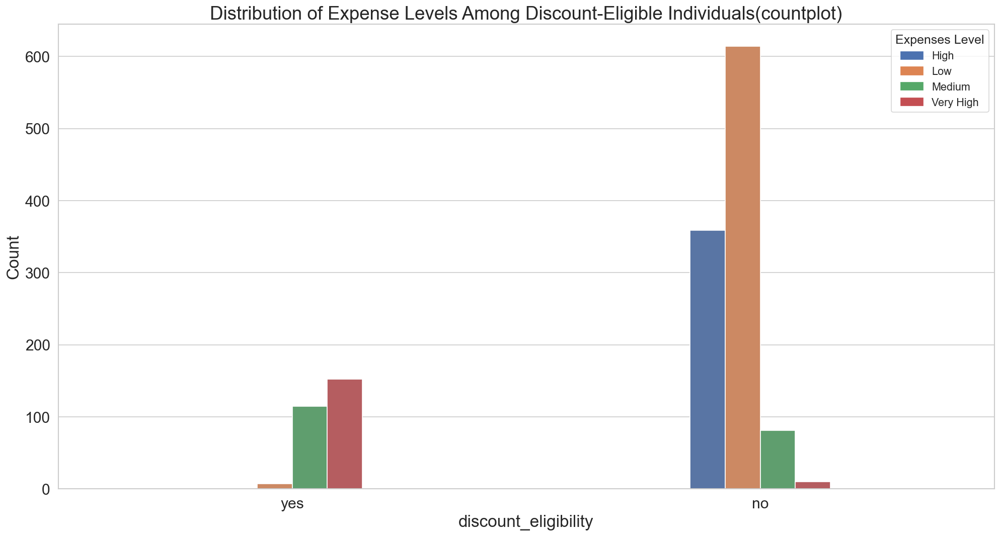

In [207]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.countplot(
    data=df,
    x="discount_eligibility",
    hue="expenses_Level",
    fill=True,
    width=0.3,
    legend=True,
    alpha=1,
    
)
plt.title(label="Distribution of Expense Levels Among Discount-Eligible Individuals(countplot)", fontsize=22)
plt.xlabel(xlabel="discount_eligibility", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["expenses_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="Expenses Level", fontsize=13, title_fontsize=15)
plt.show()

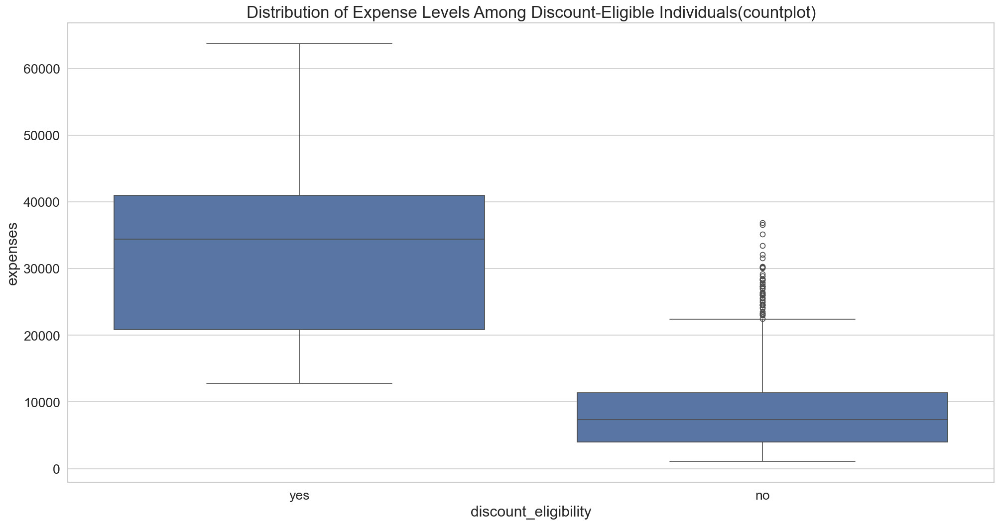

In [208]:
plt.figure(figsize=(20, 10), dpi=120)
sns.boxplot(data=df, x="discount_eligibility", y="expenses")
plt.title(
    label="Distribution of Expense Levels Among Discount-Eligible Individuals(countplot)",
    fontsize=20,
)
plt.xlabel(xlabel="discount_eligibility", fontsize=18)
plt.ylabel(ylabel="expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=16)
plt.show()

#### ☑️ Summary

---

📌Those who qualify for the discount are likely to have more children, lower income, or may have other contributing factors.<br>
📌Those who do not qualify for the discount are likely to have fewer children or be single, have higher income, or may have other contributing factors.

---

**note:**<br>
Those who are not eligible for the discount,
We see that High and Very High are also present,
These people probably had an accident, major surgery, other factors, or were affected by another illness at the time the data was collected, which increased the actual cost of treatment.

---

**As a result:**<br>
the general pattern shows that people with lower health insurance costs are more likely to qualify for discounts.

In [209]:
df["region"].unique()

<ArrowStringArray>
['southwest', 'southeast', 'northwest', 'northeast']
Length: 4, dtype: str

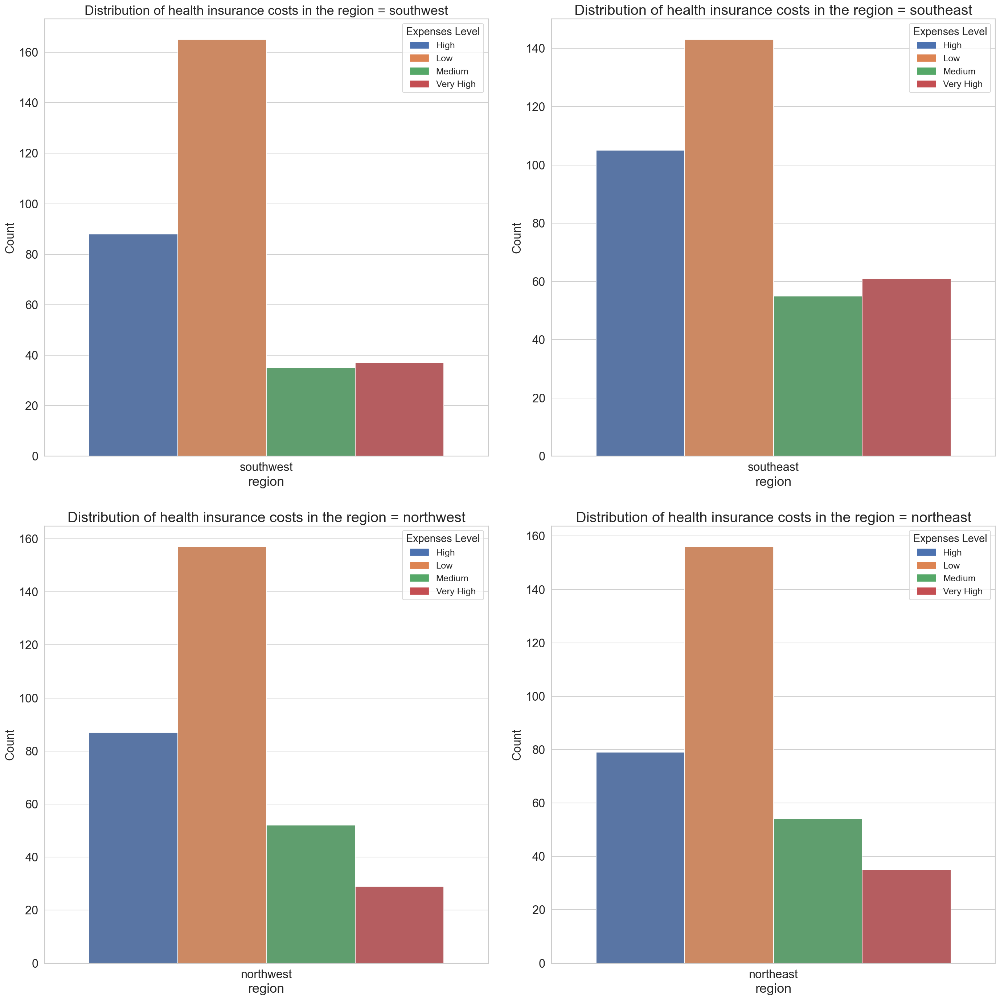

In [210]:
fig, ax = plt.subplots(2, 2, figsize=(22, 22), dpi=130)
region_southwest = df[df["region"] == "southwest"]
sns.countplot(data=region_southwest, x="region", hue="expenses_Level", ax=ax[0, 0])

ax[0, 0].set_title(
    "Distribution of health insurance costs in the region = southwest", fontsize=20
)
ax[0, 0].set_xlabel(xlabel="region", fontsize=20)
ax[0, 0].tick_params(axis="both", labelsize=18)
ax[0, 0].set_ylabel(ylabel="Count", fontsize=18)
ax[0, 0].legend(handles, levels, title="Expenses Level", fontsize=14, title_fontsize=16)

region_southeast = df[df["region"] == "southeast"]
sns.countplot(data=region_southeast, x="region", hue="expenses_Level", ax=ax[0, 1])

ax[0, 1].set_title(
    "Distribution of health insurance costs in the region = southeast", fontsize=22
)
ax[0, 1].set_xlabel(xlabel="region", fontsize=20)
ax[0, 1].tick_params(axis="both", labelsize=18)
ax[0, 1].set_ylabel(ylabel="Count", fontsize=18)
ax[0, 1].legend(handles, levels, title="Expenses Level", fontsize=14, title_fontsize=16)


region_northwest = df[df["region"] == "northwest"]
sns.countplot(data=region_northwest, x="region", hue="expenses_Level", ax=ax[1, 0])

ax[1, 0].set_title(
    "Distribution of health insurance costs in the region = northwest", fontsize=22
)
ax[1, 0].set_xlabel(xlabel="region", fontsize=20)
ax[1, 0].tick_params(axis="both", labelsize=18)
ax[1, 0].set_ylabel(ylabel="Count", fontsize=18)
ax[1, 0].legend(handles, levels, title="Expenses Level", fontsize=14, title_fontsize=16)

region_northeast = df[df["region"] == "northeast"]
sns.countplot(data=region_northeast, x="region", hue="expenses_Level", ax=ax[1, 1])

ax[1, 1].set_title(
    "Distribution of health insurance costs in the region = northeast", fontsize=22
)
ax[1, 1].set_xlabel(xlabel="region", fontsize=20)
ax[1, 1].tick_params(axis="both", labelsize=18)
ax[1, 1].set_ylabel(ylabel="Count", fontsize=18)
ax[1, 1].legend(handles, levels, title="Expenses Level", fontsize=14, title_fontsize=16)

plt.tight_layout(pad=3)
plt.show()

In [211]:
region_expenses = df.groupby("region")["expenses"].mean().sort_values(ascending=False)

C:\Users\hosse\AppData\Local\Temp\ipykernel_6832\540821986.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=region_expenses, width=0.5, palette="viridis")


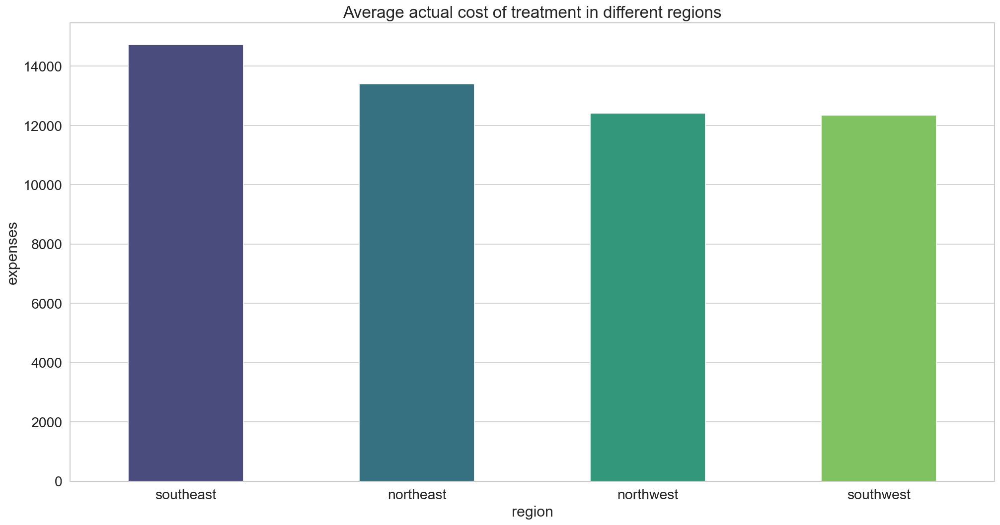

In [212]:
plt.figure(figsize=(20, 10), dpi=120)
sns.barplot(data=region_expenses, width=0.5, palette="viridis")
plt.title(label="Average actual cost of treatment in different regions", fontsize=20)
plt.xlabel(xlabel="region", fontsize=18)
plt.ylabel(ylabel="expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.show()

#### ☑️ Summary

---

📌 As we can see, the average actual cost of treatment in the Southeast region is slightly higher than in other regions, while in other regions the costs are almost constant.

## Part 3

---
Investigation of the impact of each column on the second target

In [213]:
df["premium"].min()

np.float64(11.2187)

In [214]:
df["premium_Level"] = pd.qcut(
    x=df["premium"],
    q=4,
    labels=["Low", "Medium", "High", "very High"]
)

#### age

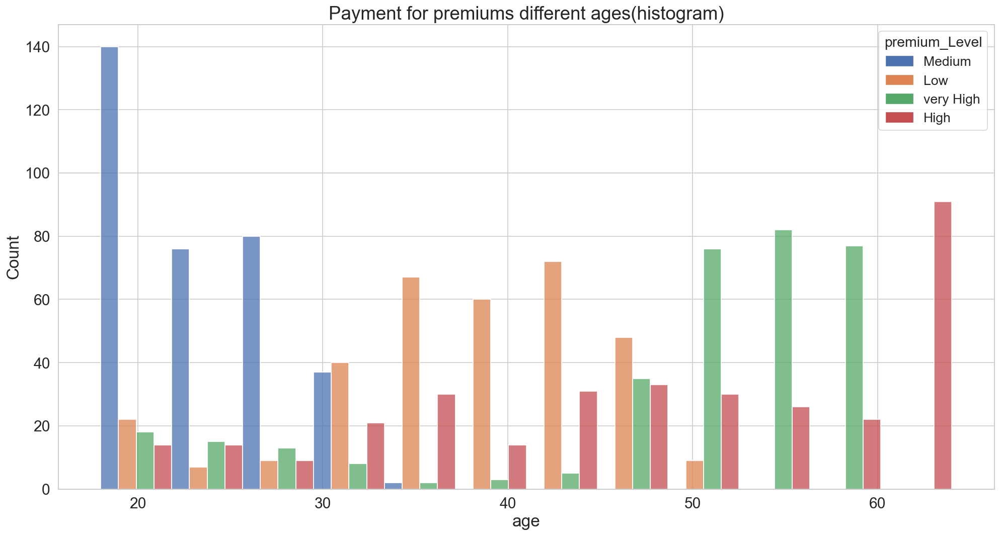

In [215]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.histplot(
    data=df,
    x="age",
    hue="premium_Level",
    multiple="dodge",
    fill=True,
    bins="auto",
    legend=True,

)
plt.title(label="Payment for premiums different ages(histogram)", fontsize=22)
plt.xlabel(xlabel="age", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="premium_Level", fontsize=16, title_fontsize=17)
plt.show()

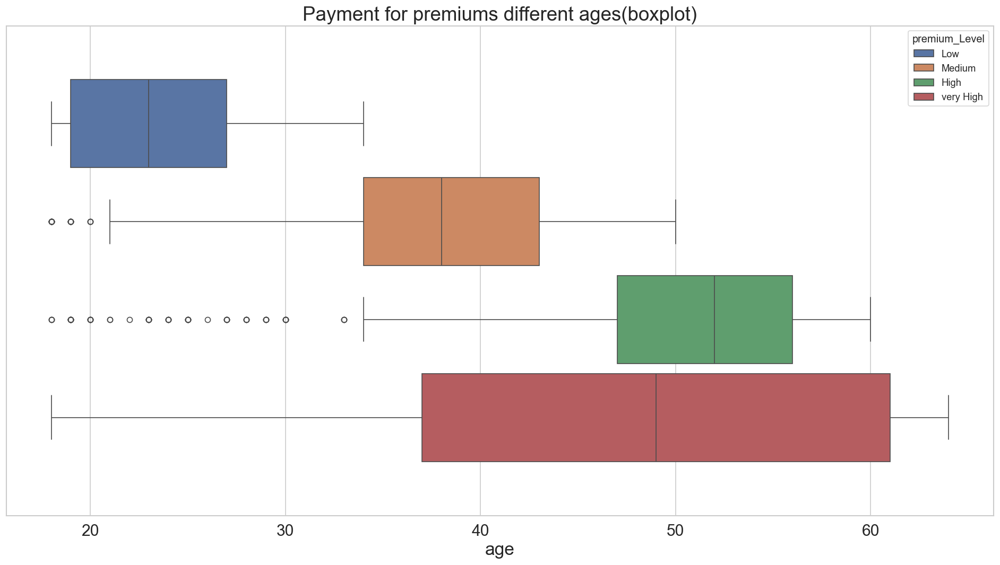

In [216]:
plt.figure(figsize=(20, 10), dpi=120)
sns.boxplot(data=df, x="age", hue="premium_Level", gap=0.1)
plt.title(label="Payment for premiums different ages(boxplot)", fontsize=22)
plt.xlabel(xlabel="age", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
plt.show()

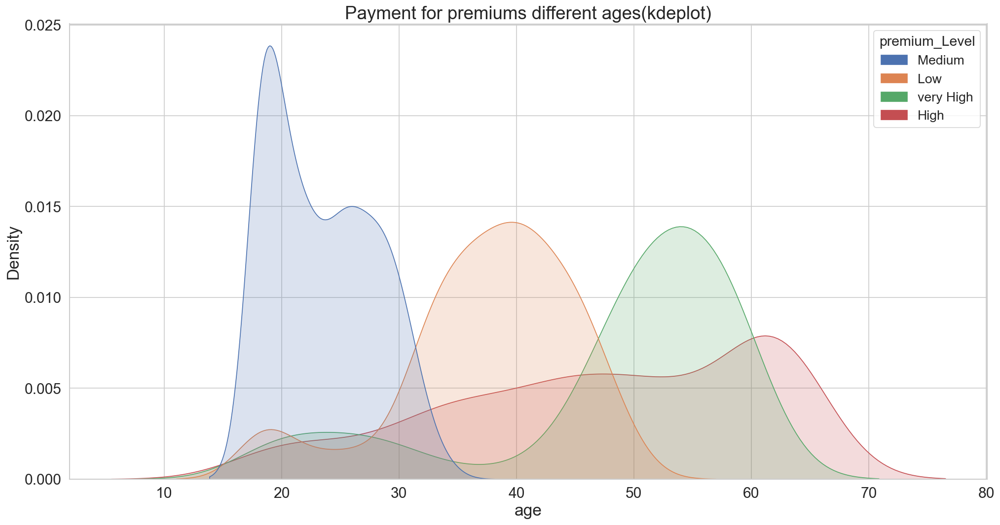

In [217]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.kdeplot(
    data=df,
    x="age",
    hue="premium_Level",
    legend=True,
    fill=True,
    alpha=0.2,
)
plt.title(label="Payment for premiums different ages(kdeplot)", fontsize=22)
plt.xlabel(xlabel="age", fontsize=20)
plt.ylabel(ylabel="Density", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="premium_Level", fontsize=16, title_fontsize=17)
plt.show()

#### ☑️ Summary

---

There is no pattern in the chart above that creates a cost difference.<br>
It can be seen at all ages and in every price range.

#### bmi

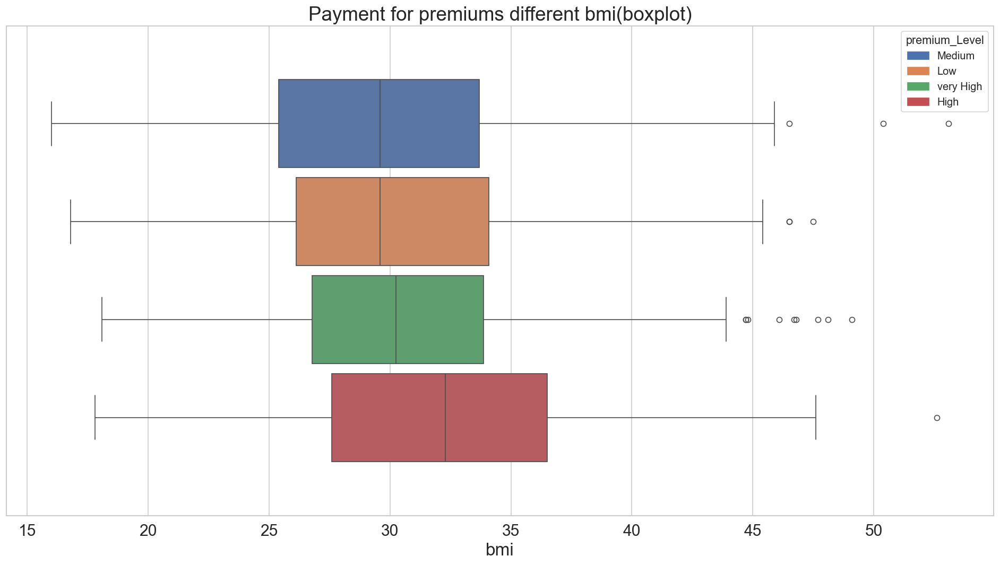

In [218]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.boxplot(data=df, x="bmi", hue="premium_Level", gap=0.1)
plt.title(label="Payment for premiums different bmi(boxplot)", fontsize=22)
plt.xlabel(xlabel="bmi", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]
ax.legend(handles, levels, title="premium_Level", fontsize=12, title_fontsize=13)
plt.show()

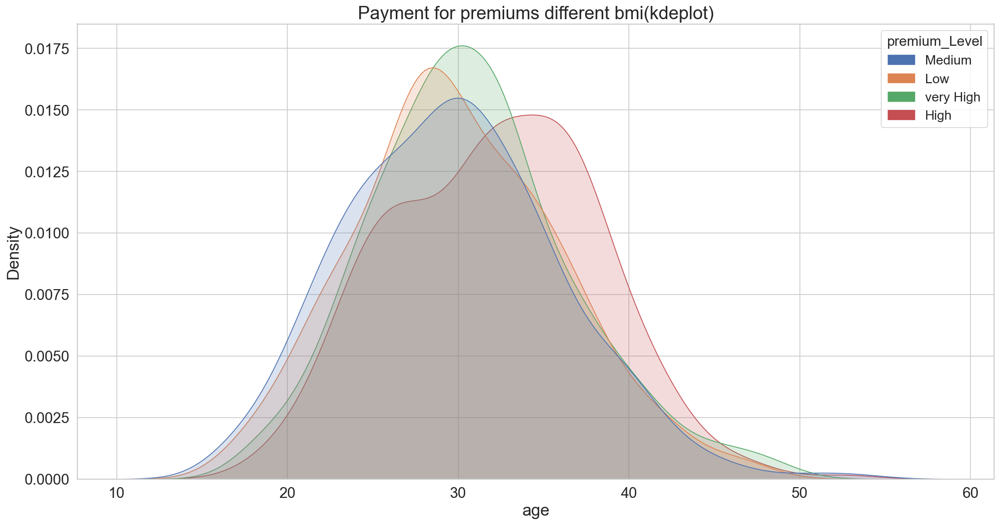

In [219]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.kdeplot(
    data=df,
    x="bmi",
    hue="premium_Level",
    legend=True,
    fill=True,
    alpha=0.2,
)
plt.title(label="Payment for premiums different bmi(kdeplot)", fontsize=22)
plt.xlabel(xlabel="age", fontsize=20)
plt.ylabel(ylabel="Density", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="premium_Level", fontsize=16, title_fontsize=17)
plt.show()

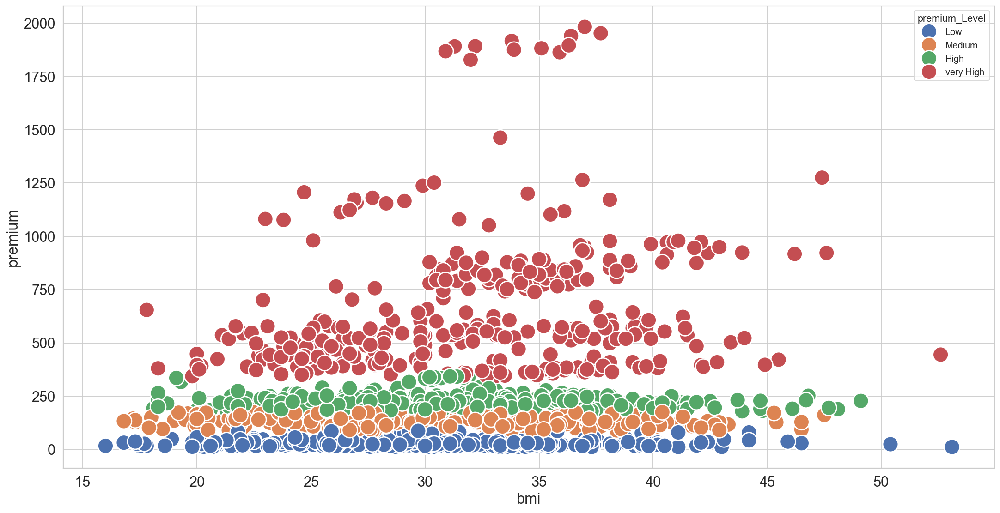

In [220]:
plt.figure(figsize=(20, 10), dpi=130)
sns.scatterplot(x=df["bmi"], y=df["premium"], s=350, hue=df["premium_Level"])
plt.title(label="")
plt.xlabel(xlabel="bmi", fontsize=18)
plt.ylabel(ylabel="premium", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]
ax.legend(handles, levels, title="premium_Level", fontsize=17, title_fontsize=18)
plt.show()

#### gender

##### male

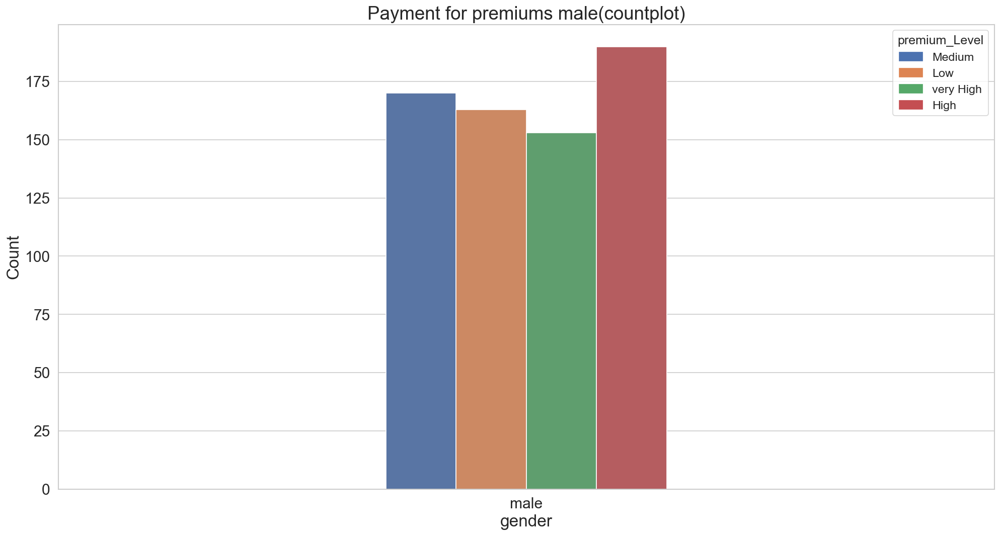

In [221]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.countplot(
    data=df[df["gender"] == "male"],
    x="gender",
    hue="premium_Level",
    width=0.3,
    legend=True,
    alpha=1,
)
plt.title(label="Payment for premiums male(countplot)", fontsize=22)
plt.xlabel(xlabel="gender", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(
    handles,
    levels,
    title="premium_Level",
    fontsize=14,
    title_fontsize=15,
    loc="best",
)
plt.show()

##### female


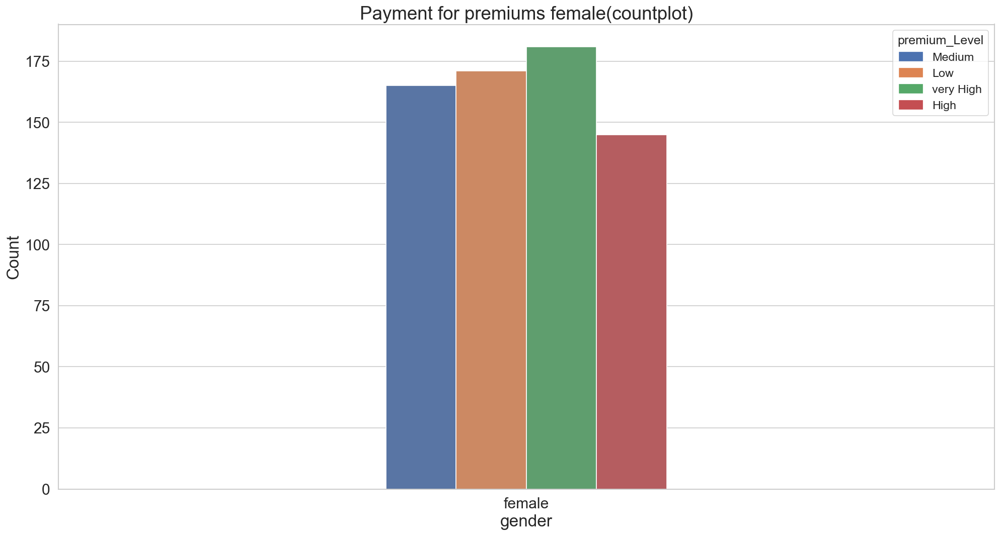

In [222]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.countplot(
    data=df[df["gender"] == "female"],
    x="gender",
    hue="premium_Level",
    width=0.3,
    legend=True,
    alpha=1,
)
plt.title(label="Payment for premiums female(countplot)", fontsize=22)
plt.xlabel(xlabel="gender", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(
    handles,
    levels,
    title="premium_Level",
    fontsize=14,
    title_fontsize=15,
    loc="best",
)
plt.show()

In [223]:
df.columns

Index(['age', 'gender', 'bmi', 'children', 'discount_eligibility', 'region',
       'expenses', 'premium', 'expenses_Level', 'premium_Level'],
      dtype='str')

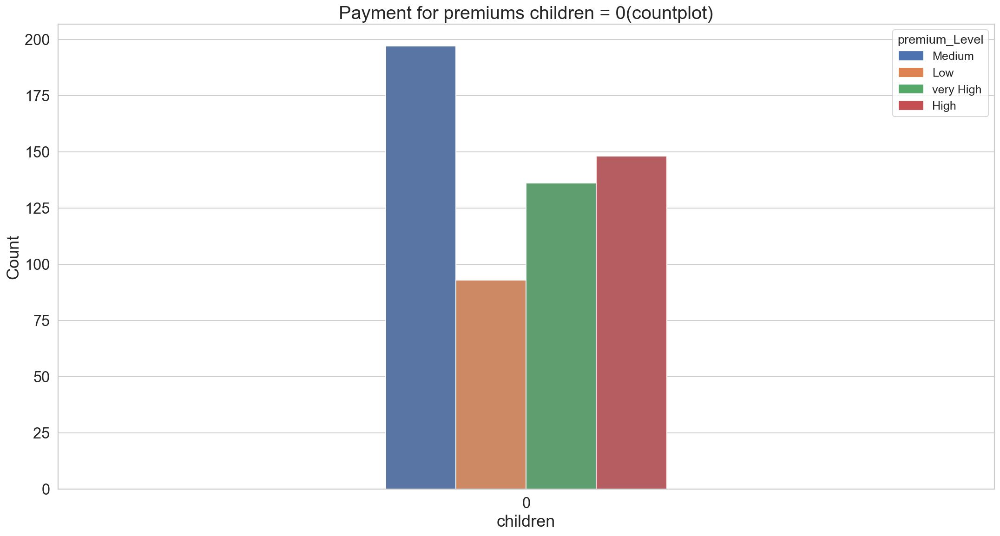

In [224]:
plt.figure(figsize=(20, 10), dpi=130)
ax = sns.countplot(
    data=df[df["children"] == 0],
    x="children",
    hue="premium_Level",
    width=0.3,
    legend=True,
    alpha=1,
)
plt.title(label="Payment for premiums children = 0(countplot)", fontsize=22)
plt.xlabel(xlabel="children", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(
    handles,
    levels,
    title="premium_Level",
    fontsize=14,
    title_fontsize=15,
    loc="best",
)
plt.show()

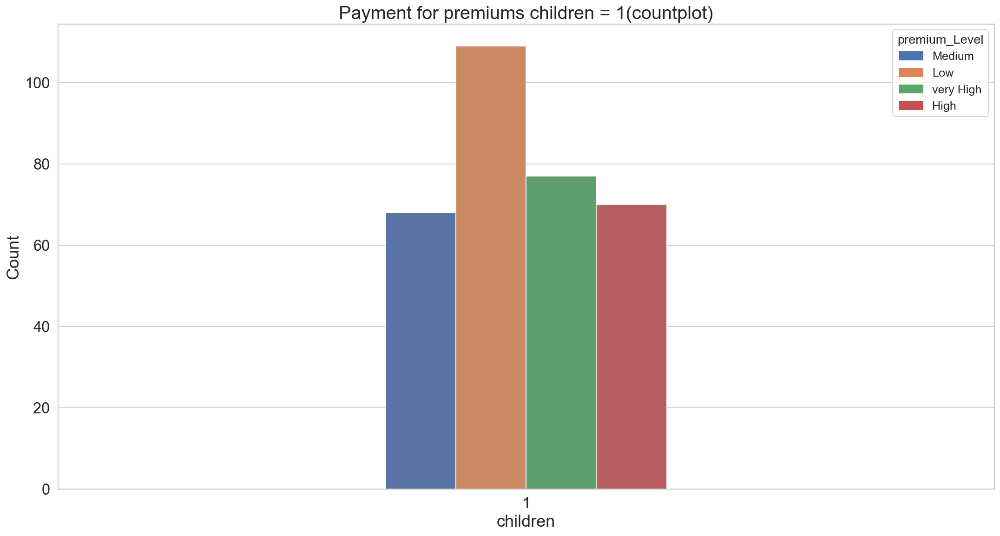

In [225]:
plt.figure(figsize=(20, 10), dpi=130)
ax = sns.countplot(
    data=df[df["children"] == 1],
    x="children",
    hue="premium_Level",
    width=0.3,
    legend=True,
    alpha=1,
)
plt.title(label="Payment for premiums children = 1(countplot)", fontsize=22)
plt.xlabel(xlabel="children", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(
    handles,
    levels,
    title="premium_Level",
    fontsize=14,
    title_fontsize=15,
    loc="best",
)
plt.show()

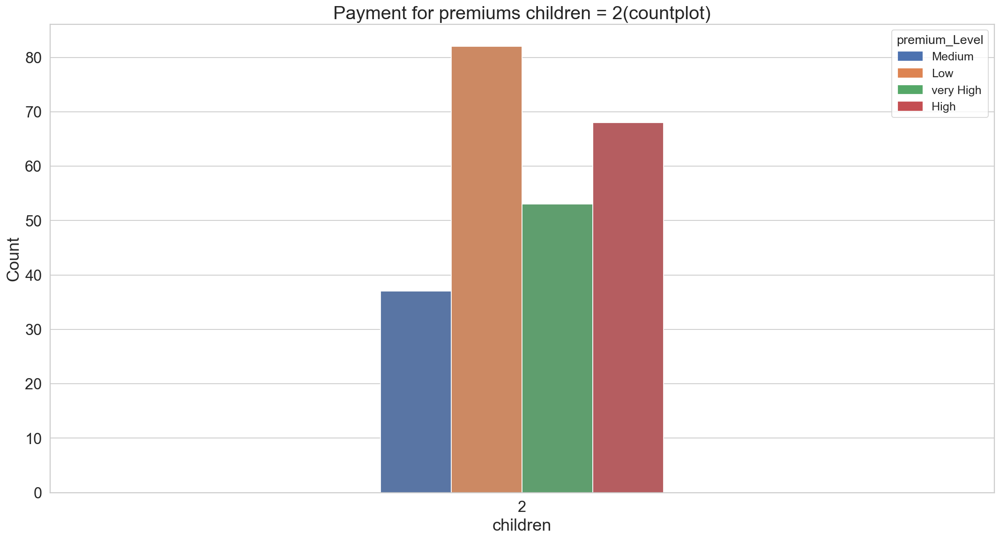

In [226]:
plt.figure(figsize=(20, 10), dpi=130)
ax = sns.countplot(
    data=df[df["children"] == 2],
    x="children",
    hue="premium_Level",
    width=0.3,
    legend=True,
    alpha=1,
)
plt.title(label="Payment for premiums children = 2(countplot)", fontsize=22)
plt.xlabel(xlabel="children", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(
    handles,
    levels,
    title="premium_Level",
    fontsize=14,
    title_fontsize=15,
    loc="best",
)
plt.show()

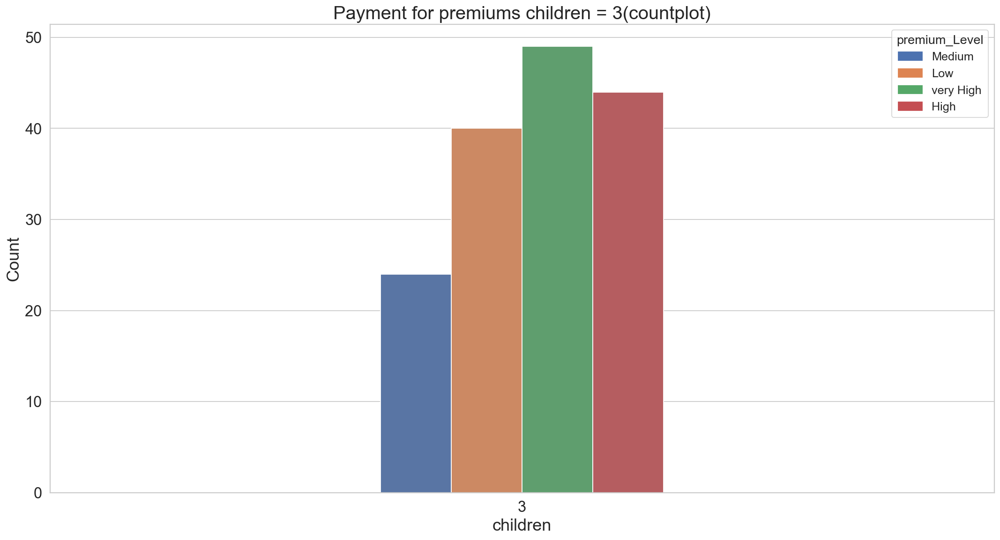

In [227]:
plt.figure(figsize=(20, 10), dpi=130)
ax = sns.countplot(
    data=df[df["children"] == 3],
    x="children",
    hue="premium_Level",
    width=0.3,
    legend=True,
    alpha=1,
)
plt.title(label="Payment for premiums children = 3(countplot)", fontsize=22)
plt.xlabel(xlabel="children", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(
    handles,
    levels,
    title="premium_Level",
    fontsize=14,
    title_fontsize=15,
    loc="best",
)
plt.show()

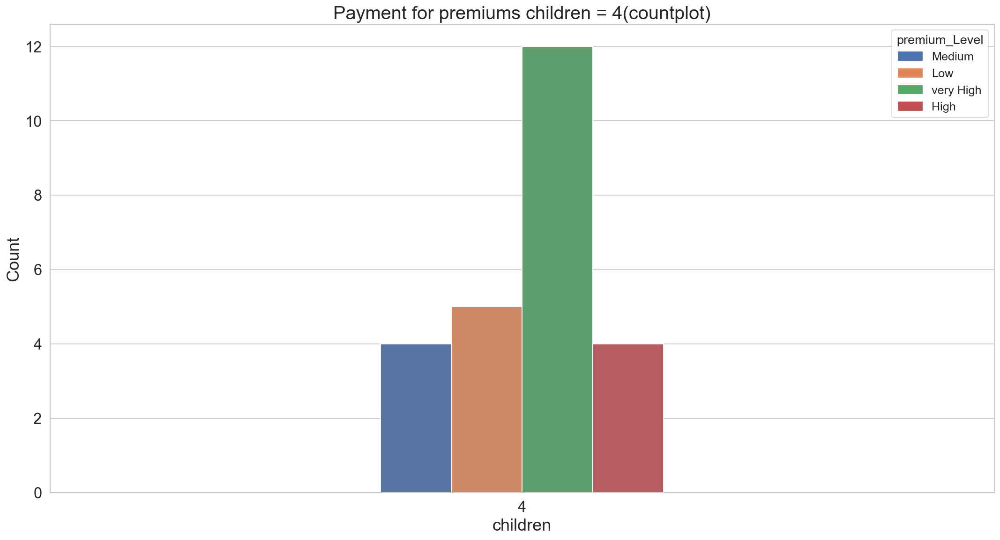

In [228]:
plt.figure(figsize=(20, 10), dpi=130)
ax = sns.countplot(
    data=df[df["children"] == 4],
    x="children",
    hue="premium_Level",
    width=0.3,
    legend=True,
    alpha=1,
)
plt.title(label="Payment for premiums children = 4(countplot)", fontsize=22)
plt.xlabel(xlabel="children", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(
    handles,
    levels,
    title="premium_Level",
    fontsize=14,
    title_fontsize=15,
    loc="best",
)
plt.show()

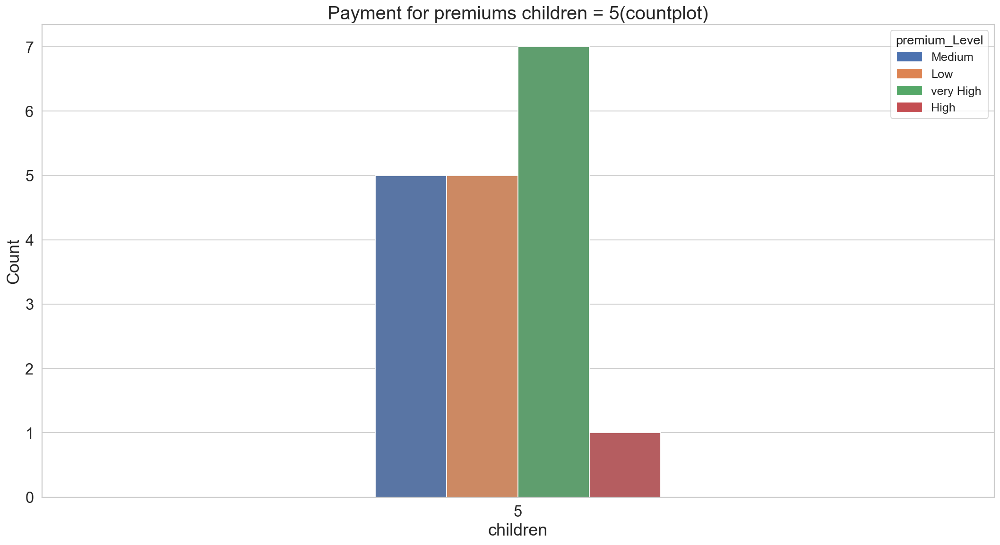

In [229]:
plt.figure(figsize=(20, 10), dpi=130)
ax = sns.countplot(
    data=df[df["children"] == 5],
    x="children",
    hue="premium_Level",
    width=0.3,
    legend=True,
    alpha=1,
)
plt.title(label="Payment for premiums children = 5(countplot)", fontsize=22)
plt.xlabel(xlabel="children", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(
    handles,
    levels,
    title="premium_Level",
    fontsize=14,
    title_fontsize=15,
    loc="best",
)
plt.show()

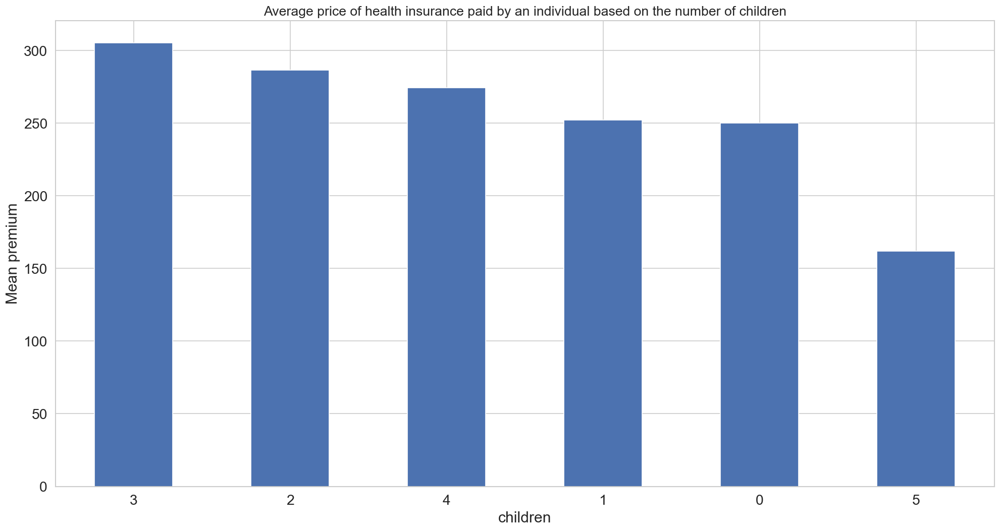

In [230]:
plt.figure(figsize=(20, 10), dpi=120)
df.groupby("children")["premium"].mean().sort_values(ascending=False).plot(kind="bar")
plt.title(
    label="Average price of health insurance paid by an individual based on the number of children",
    fontsize=16,
)
plt.xlabel(xlabel="children", fontsize=18)
plt.ylabel(ylabel="Mean premium", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(rotation=0)
plt.show()

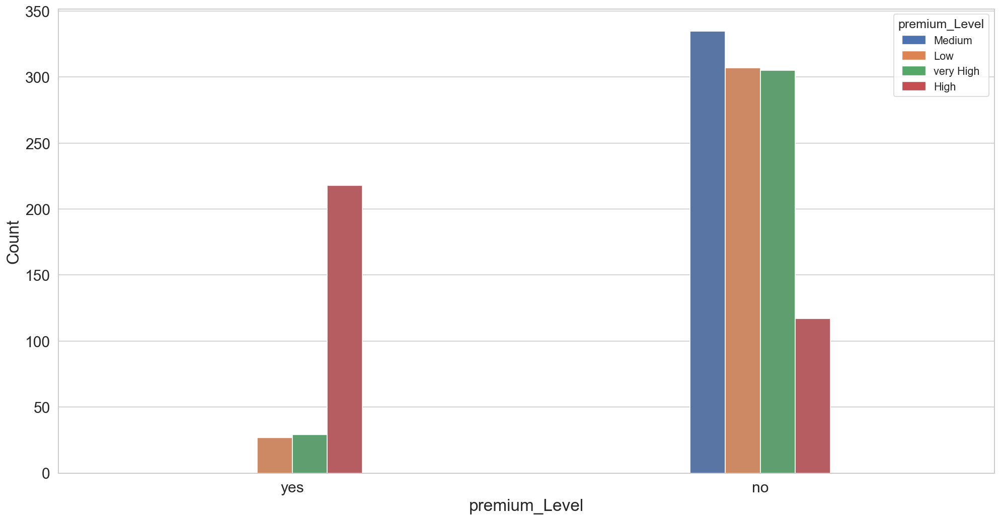

In [231]:
plt.figure(figsize=(20, 10), dpi=120)
ax = sns.countplot(
    data=df,
    x="discount_eligibility",
    hue="premium_Level",
    fill=True,
    width=0.3,
    legend=True,
    alpha=1,
    
)
plt.title(label="", fontsize=22)
plt.xlabel(xlabel="premium_Level", fontsize=20)
plt.ylabel(ylabel="Count", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
levels = df["premium_Level"].unique()
handles = [
    plt.Rectangle((0, 0), 1, 1, color=c)
    for c in sns.color_palette(n_colors=len(levels))
]

ax.legend(handles, levels, title="premium_Level", fontsize=13, title_fontsize=15)
plt.show()

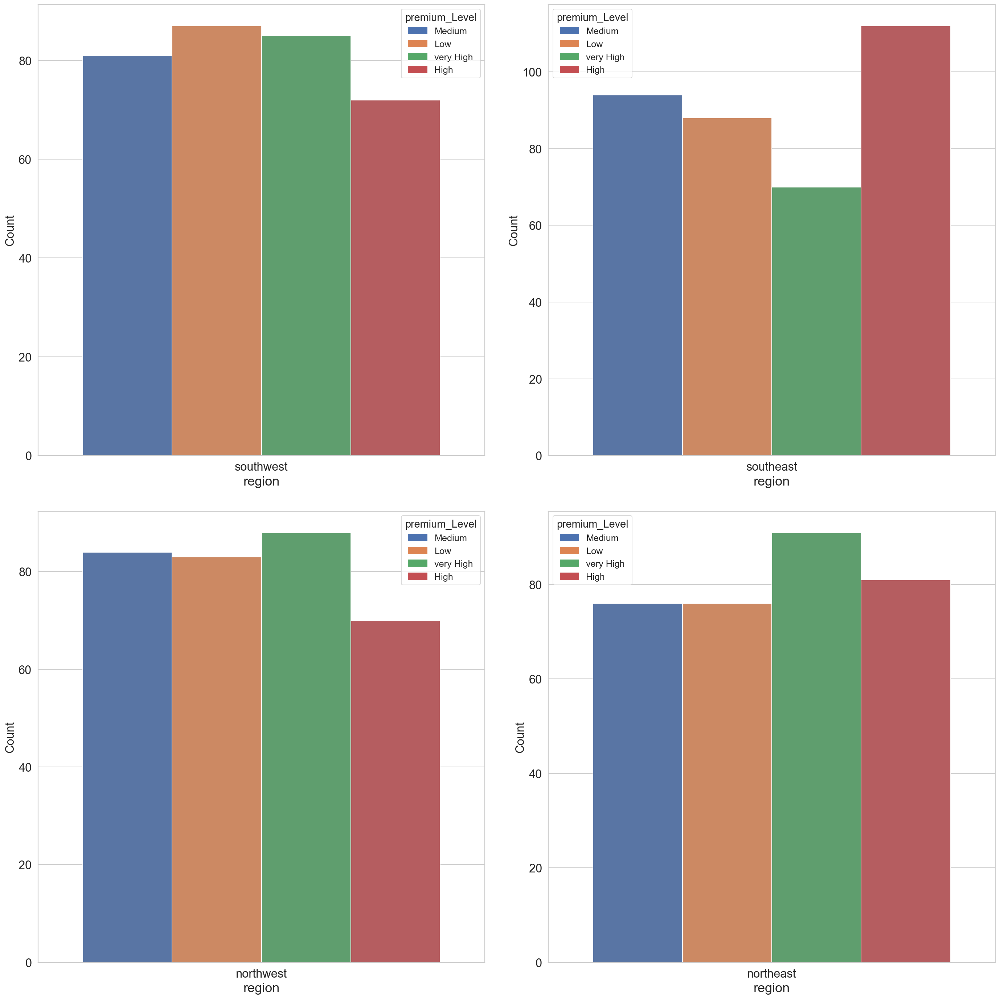

In [232]:
fig, ax = plt.subplots(2, 2, figsize=(22, 22), dpi=130)
region_southwest = df[df["region"] == "southwest"]
sns.countplot(data=region_southwest, x="region", hue="premium_Level", ax=ax[0, 0])

ax[0, 0].set_title(
    "", fontsize=20
)
ax[0, 0].set_xlabel(xlabel="region", fontsize=20)
ax[0, 0].tick_params(axis="both", labelsize=18)
ax[0, 0].set_ylabel(ylabel="Count", fontsize=18)
ax[0, 0].legend(handles, levels, title="premium_Level", fontsize=14, title_fontsize=16)

region_southeast = df[df["region"] == "southeast"]
sns.countplot(data=region_southeast, x="region", hue="premium_Level", ax=ax[0, 1])

ax[0, 1].set_title(
    "", fontsize=22
)
ax[0, 1].set_xlabel(xlabel="region", fontsize=20)
ax[0, 1].tick_params(axis="both", labelsize=18)
ax[0, 1].set_ylabel(ylabel="Count", fontsize=18)
ax[0, 1].legend(handles, levels, title="premium_Level", fontsize=14, title_fontsize=16)


region_northwest = df[df["region"] == "northwest"]
sns.countplot(data=region_northwest, x="region", hue="premium_Level", ax=ax[1, 0])

ax[1, 0].set_title(
    "", fontsize=22
)
ax[1, 0].set_xlabel(xlabel="region", fontsize=20)
ax[1, 0].tick_params(axis="both", labelsize=18)
ax[1, 0].set_ylabel(ylabel="Count", fontsize=18)
ax[1, 0].legend(handles, levels, title="premium_Level", fontsize=14, title_fontsize=16)

region_northeast = df[df["region"] == "northeast"]
sns.countplot(data=region_northeast, x="region", hue="premium_Level", ax=ax[1, 1])

ax[1, 1].set_title(
    "", fontsize=22
)
ax[1, 1].set_xlabel(xlabel="region", fontsize=20)
ax[1, 1].tick_params(axis="both", labelsize=18)
ax[1, 1].set_ylabel(ylabel="Count", fontsize=18)
ax[1, 1].legend(handles, levels, title="premium_Level", fontsize=14, title_fontsize=16)

plt.tight_layout(pad=3)
plt.show()

#### ☑️ Summary

In [233]:
df.columns

Index(['age', 'gender', 'bmi', 'children', 'discount_eligibility', 'region',
       'expenses', 'premium', 'expenses_Level', 'premium_Level'],
      dtype='str')

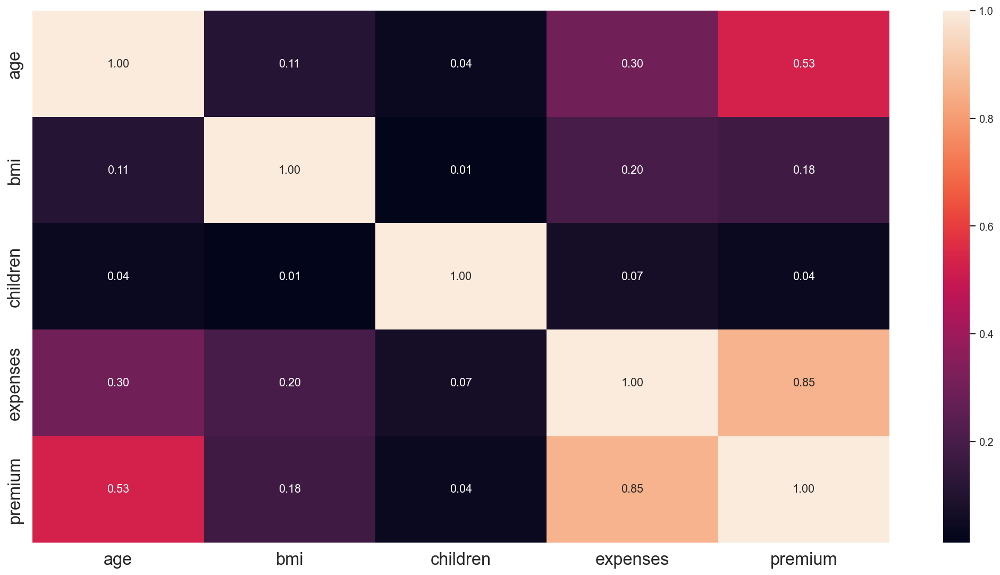

In [234]:
plt.figure(figsize=(20, 10), dpi=130)
sns.heatmap(df.corr(numeric_only=True), fmt=".2f", annot=True, cmap="rocket")
plt.title(label="", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
plt.show()

#### ☑️ Summary

#### age vs bmi with expenses / premium

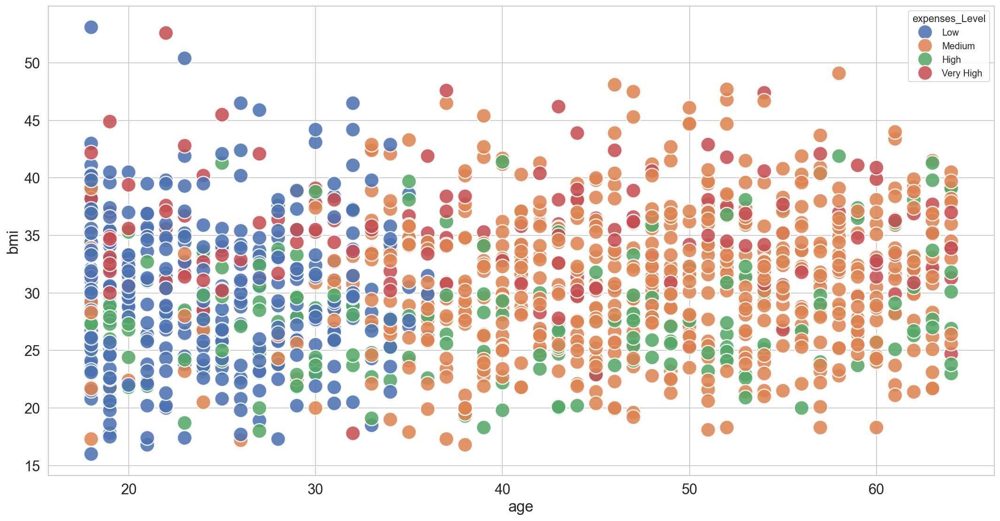

In [235]:
plt.figure(figsize=(20, 10), dpi=130)
sns.scatterplot(
    data=df,
    x="age",
    y="bmi",
    hue="expenses_Level",
    s=300,
    alpha=0.87

)
plt.title(label="", fontsize=20)
plt.xlabel(xlabel="age", fontsize=18)
plt.ylabel(ylabel="bmi", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.show()

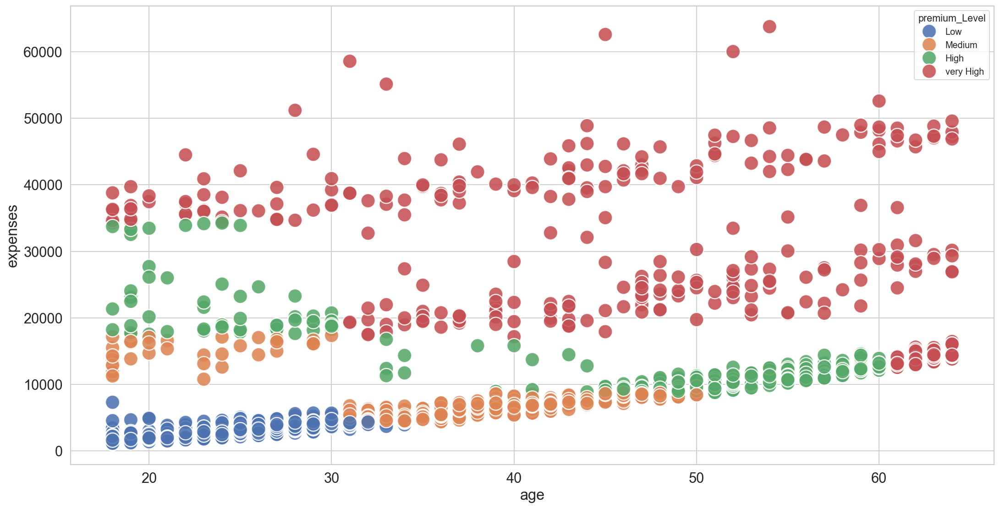

In [236]:
plt.figure(figsize=(20, 10), dpi=130)
sns.scatterplot(
    data=df,
    x="age",
    y="expenses",
    hue="premium_Level",
    s=300,
    alpha=0.87

)
plt.title(label="", fontsize=20)
plt.xlabel(xlabel="age", fontsize=18)
plt.ylabel(ylabel="expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.show()

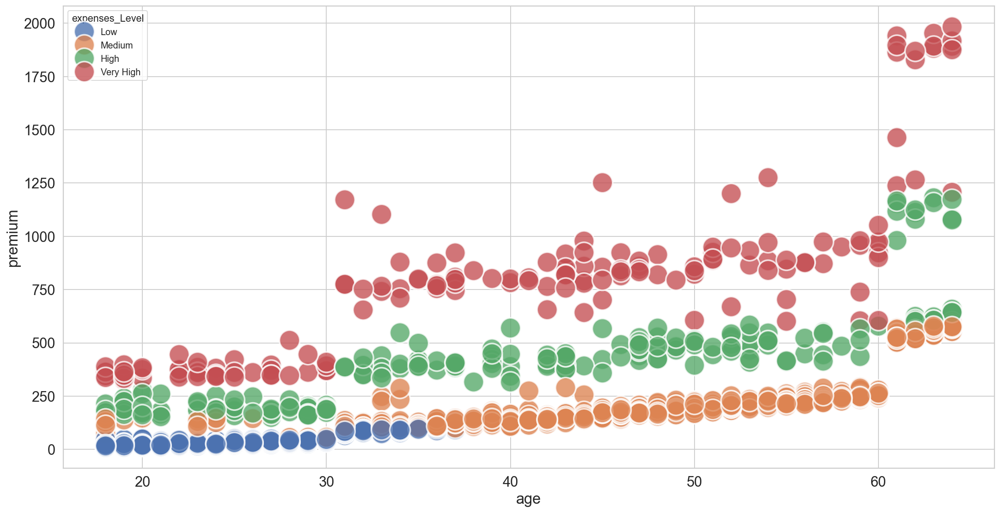

In [237]:
plt.figure(figsize=(20, 10), dpi=130)
sns.scatterplot(
    data=df,
    x="age",
    y="premium",
    hue="expenses_Level",
    s=600,
    alpha=0.78

)
plt.title(label="", fontsize=20)
plt.xlabel(xlabel="age", fontsize=18)
plt.ylabel(ylabel="premium", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.show()

We can say that as a person ages, the cost of health insurance increases.

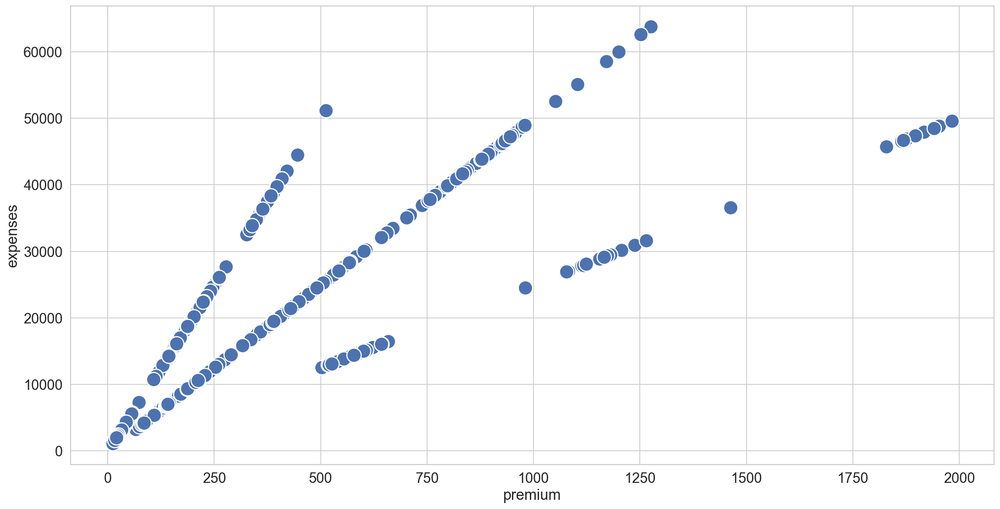

In [238]:
plt.figure(figsize=(20, 10), dpi=130)
sns.scatterplot(
    data=df,
    y="expenses",
    x="premium",
    s=300,

)
plt.title(label="", fontsize=20)
plt.xlabel(xlabel="premium", fontsize=18)
plt.ylabel(ylabel="expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.show()

We can say that as the cost of health insurance paid by an individual increases, the insurance company must also pay more for the individual's medical expenses.

#### Handle Outliers

In [239]:
df = df[(df["bmi"]<50) & (df["premium"]<1000)&(df["expenses"]<50000)]

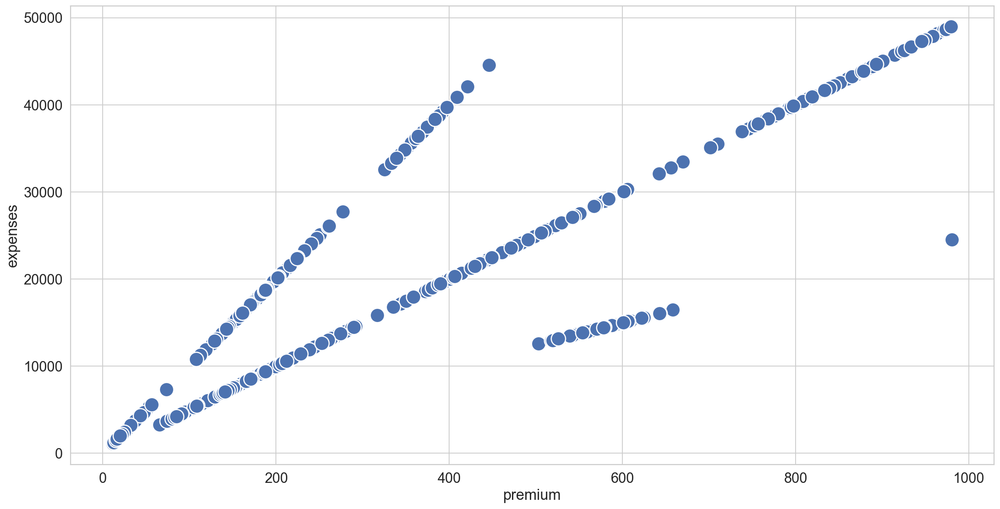

In [240]:
plt.figure(figsize=(20, 10), dpi=130)
sns.scatterplot(
    data=df,
    y="expenses",
    x="premium",
    s=300,

)
plt.title(label="", fontsize=20)
plt.xlabel(xlabel="premium", fontsize=18)
plt.ylabel(ylabel="expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.show()

In [241]:
df[df["premium"]>980]

,age,gender,bmi,children,discount_eligibility,region,expenses,premium,expenses_Level,premium_Level
491,61,female,25.1,0,no,southeast,24513.09,980.5236,High,very High


In [242]:
df.drop(index=491, inplace=True)

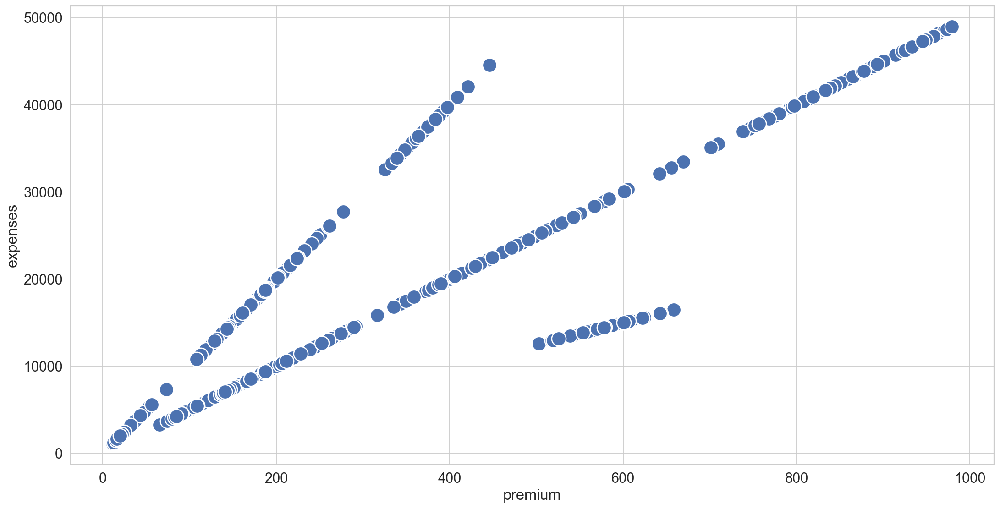

In [243]:
plt.figure(figsize=(20, 10), dpi=130)
sns.scatterplot(
    data=df,
    y="expenses",
    x="premium",
    s=300,

)
plt.title(label="", fontsize=20)
plt.xlabel(xlabel="premium", fontsize=18)
plt.ylabel(ylabel="expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.show()

In [244]:
df.columns

Index(['age', 'gender', 'bmi', 'children', 'discount_eligibility', 'region',
       'expenses', 'premium', 'expenses_Level', 'premium_Level'],
      dtype='str')

### Encoding

In [245]:
df = pd.get_dummies(
    data=df, columns=["region"]
)

In [246]:
df

,age,gender,bmi,children,discount_eligibility,expenses,premium,expenses_Level,premium_Level,region_northeast,region_northwest,region_southeast,region_southwest
0,19,female,27.9,0,yes,16884.92,168.8492,High,Medium,False,False,False,True
1,18,male,33.8,1,no,1725.55,17.2555,Low,Low,False,False,True,False
2,28,male,33.0,3,no,4449.46,44.4946,Low,Low,False,False,True,False
3,33,male,22.7,0,no,21984.47,439.6894,High,very High,False,True,False,False
4,32,male,28.9,0,no,3866.86,77.3372,Low,Low,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1332,52,female,44.7,3,no,11411.69,228.2338,Medium,High,False,False,False,True
1333,50,male,31.0,3,no,10600.55,212.0110,Medium,High,False,True,False,False
1334,18,female,31.9,0,no,2205.98,22.0598,Low,Low,True,False,False,False
1335,18,female,36.9,0,no,1629.83,16.2983,Low,Low,False,False,True,False


In [247]:
df.drop(columns=["expenses_Level", "premium_Level"], inplace=True)

In [248]:
df

,age,gender,bmi,children,discount_eligibility,expenses,premium,region_northeast,region_northwest,region_southeast,region_southwest
0,19,female,27.9,0,yes,16884.92,168.8492,False,False,False,True
1,18,male,33.8,1,no,1725.55,17.2555,False,False,True,False
2,28,male,33.0,3,no,4449.46,44.4946,False,False,True,False
3,33,male,22.7,0,no,21984.47,439.6894,False,True,False,False
4,32,male,28.9,0,no,3866.86,77.3372,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...
1332,52,female,44.7,3,no,11411.69,228.2338,False,False,False,True
1333,50,male,31.0,3,no,10600.55,212.0110,False,True,False,False
1334,18,female,31.9,0,no,2205.98,22.0598,True,False,False,False
1335,18,female,36.9,0,no,1629.83,16.2983,False,False,True,False


In [249]:
df.replace(
    {"gender": {"male": 1, "female": 0}, "discount_eligibility": {"no": 0, "yes": 1}},
    inplace=True,
)

,age,gender,bmi,children,discount_eligibility,expenses,premium,region_northeast,region_northwest,region_southeast,region_southwest
0,19,0,27.9,0,1,16884.92,168.8492,False,False,False,True
1,18,1,33.8,1,0,1725.55,17.2555,False,False,True,False
2,28,1,33.0,3,0,4449.46,44.4946,False,False,True,False
3,33,1,22.7,0,0,21984.47,439.6894,False,True,False,False
4,32,1,28.9,0,0,3866.86,77.3372,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...
1332,52,0,44.7,3,0,11411.69,228.2338,False,False,False,True
1333,50,1,31.0,3,0,10600.55,212.0110,False,True,False,False
1334,18,0,31.9,0,0,2205.98,22.0598,True,False,False,False
1335,18,0,36.9,0,0,1629.83,16.2983,False,False,True,False


In [250]:
df

,age,gender,bmi,children,discount_eligibility,expenses,premium,region_northeast,region_northwest,region_southeast,region_southwest
0,19,0,27.9,0,1,16884.92,168.8492,False,False,False,True
1,18,1,33.8,1,0,1725.55,17.2555,False,False,True,False
2,28,1,33.0,3,0,4449.46,44.4946,False,False,True,False
3,33,1,22.7,0,0,21984.47,439.6894,False,True,False,False
4,32,1,28.9,0,0,3866.86,77.3372,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...
1332,52,0,44.7,3,0,11411.69,228.2338,False,False,False,True
1333,50,1,31.0,3,0,10600.55,212.0110,False,True,False,False
1334,18,0,31.9,0,0,2205.98,22.0598,True,False,False,False
1335,18,0,36.9,0,0,1629.83,16.2983,False,False,True,False


#### section 4: Model

#### model for **expenses**

In [251]:
x = df.drop(columns=["expenses"])
y = df["expenses"].values.reshape(-1, 1)

In [252]:
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, random_state=42
)

#### sample regression

In [253]:
pipline_regression = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

In [254]:
pipline_regression.fit(x_train, y_train)
y_pred = pipline_regression.predict(x_test)

In [255]:
print(f"model coef:\n{pipline_regression['model'].coef_}")
print("_"*80)
print(f"model intercept: {pipline_regression['model'].intercept_}")

model coef:
[[-1382.94513833   -36.94641421   642.33437707   344.11820649
   3378.60155267  8338.90844362    13.81935329    57.48349302
    -61.62461867    -8.58846368]]
________________________________________________________________________________
model intercept: [12341.38747115]


In [256]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 2694.3283219662862
mean_squared_error: 14627290.118499482
root_mean_squared_error: 3824.5640429334535
r2 score: 0.8986117180179908


In [257]:
df2 = x_test.copy(deep=True)

In [258]:
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)

In [259]:
df2.sort_values(by="premium", inplace=True)

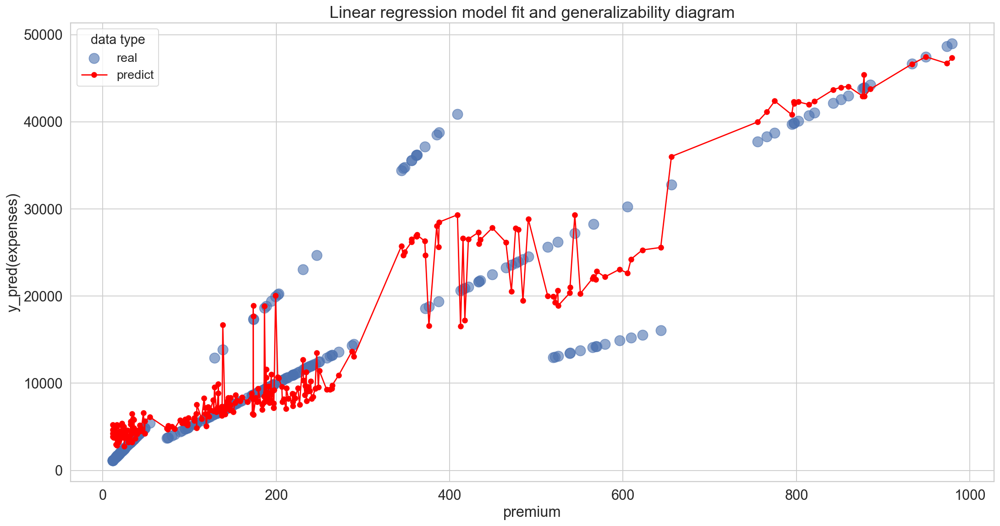

In [260]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(x=df2["premium"], y=df2["y_test"], s=150, label="real", alpha=0.6)
plt.plot(df2["premium"], df2["y_pred"], label="predict", color="red", marker="o")
plt.title(
    label="Linear regression model fit and generalizability diagram", fontsize=20
)
plt.xlabel("premium", fontsize=18)
plt.ylabel("y_pred(expenses)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

In [261]:
print(pipline_regression.score(x_train, y_train))
print(pipline_regression.score(x_test, y_test))

0.8953331747601387
0.8986117180179908


#### ☑️ summary model linear regression

---

📌 The linear regression model does not have good generalizability, does not provide good accuracy, and the error rate is very high.

#### KNN Regressor

In [262]:
pipline_KNeighbors = Pipeline([
    ('scaler', StandardScaler()),
    ('model', (KNeighborsRegressor()))
])

In [263]:
pipline_KNeighbors.fit(x_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [264]:
y_pred = pipline_KNeighbors.predict(x_test)

In [265]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 2354.7492846153846
mean_squared_error: 19464735.395829957
root_mean_squared_error: 4411.885696142859
r2 score: 0.8650812238610297


In [266]:
r2_KNeighbors = []
mse_KNeighbors = []
train_scores = []
test_scores = []
for i in range(1, 21):
    pipline_KNeighbors.set_params(model__n_neighbors=i)
    pipline_KNeighbors.fit(x_train, y_train.ravel())
    y_pred = pipline_KNeighbors.predict(x_test)
    r2_KNeighbors.append(metrics.r2_score(y_test, y_pred))
    mse_KNeighbors.append(metrics.mean_squared_error(y_test, y_pred))
    train_scores.append(pipline_KNeighbors.score(x_train, y_train.ravel()))
    test_scores.append(pipline_KNeighbors.score(x_test, y_test.ravel()))
    print(f"k = {i}:")
    print(f"r2: {metrics.r2_score(y_test, y_pred)}")
    print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
    print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
    print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
    print(f"train score: {pipline_KNeighbors.score(x_train, y_train.ravel())}")
    print(f"test score: {pipline_KNeighbors.score(x_test, y_test.ravel())}")
    print("_" * 80)

k = 1:
r2: 0.8392347951772463
mean_squared_error: 23193600.344462696
mean_absolute_error: 2333.1021923076923
root_mean_squared_error: 4815.973457616092
train score: 1.0
test score: 0.8392347951772463
________________________________________________________________________________
k = 2:
r2: 0.8568793989308965
mean_squared_error: 20648012.895053074
mean_absolute_error: 2383.804846153846
root_mean_squared_error: 4544.008461155533
train score: 0.9739796488610444
test score: 0.8568793989308965
________________________________________________________________________________
k = 3:
r2: 0.8530525103951464
mean_squared_error: 21200118.205147095
mean_absolute_error: 2377.8681025641026
root_mean_squared_error: 4604.358609529355
train score: 0.9509155297786334
test score: 0.8530525103951464
________________________________________________________________________________
k = 4:
r2: 0.8643082000859028
mean_squared_error: 19576259.55627767
mean_absolute_error: 2284.8497211538465
root_mean_squared_er

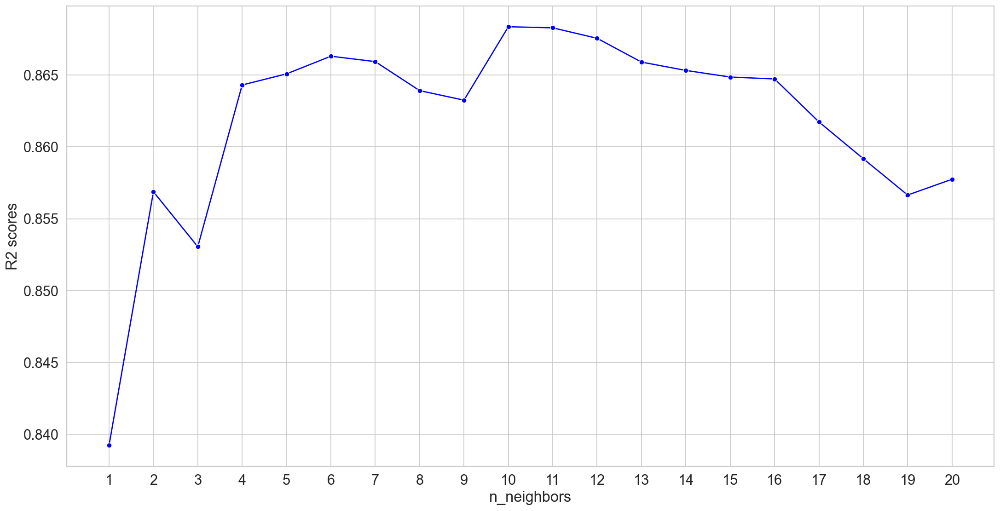

In [267]:
plt.figure(figsize=(20, 10), dpi=130)
sns.lineplot(x=range(1, 21), y=r2_KNeighbors, color="blue", marker="o")
plt.title(label="", fontsize=20)
plt.xlabel(xlabel="n_neighbors", fontsize=18)
plt.ylabel(ylabel="R2 scores", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(ticks=range(1, 21, 1))
plt.show()

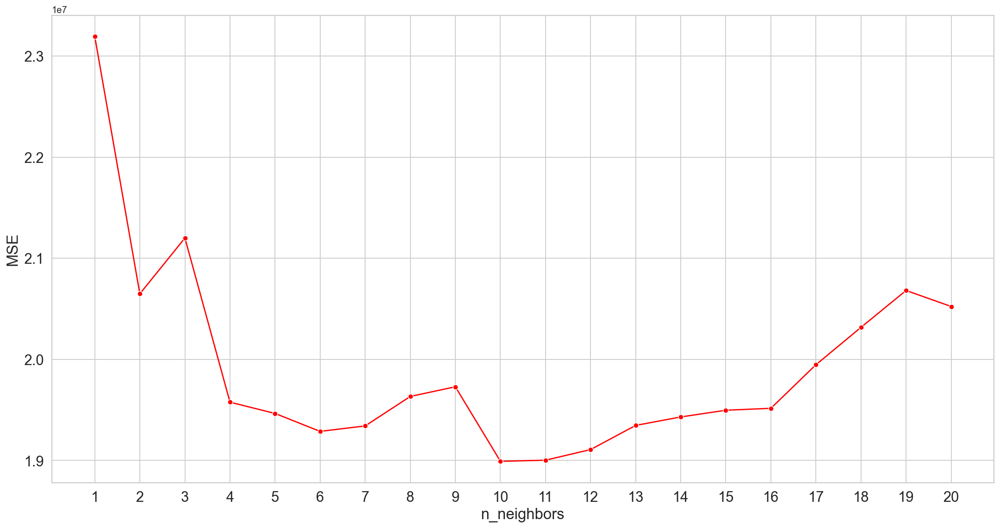

In [268]:
plt.figure(figsize=(20, 10), dpi=130)
sns.lineplot(x=range(1, 21), y=mse_KNeighbors, color="red", marker="o")
plt.title(label="", fontsize=20)
plt.xlabel(xlabel="n_neighbors", fontsize=18)
plt.ylabel(ylabel="MSE", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(ticks=range(1, 21, 1))
plt.show()

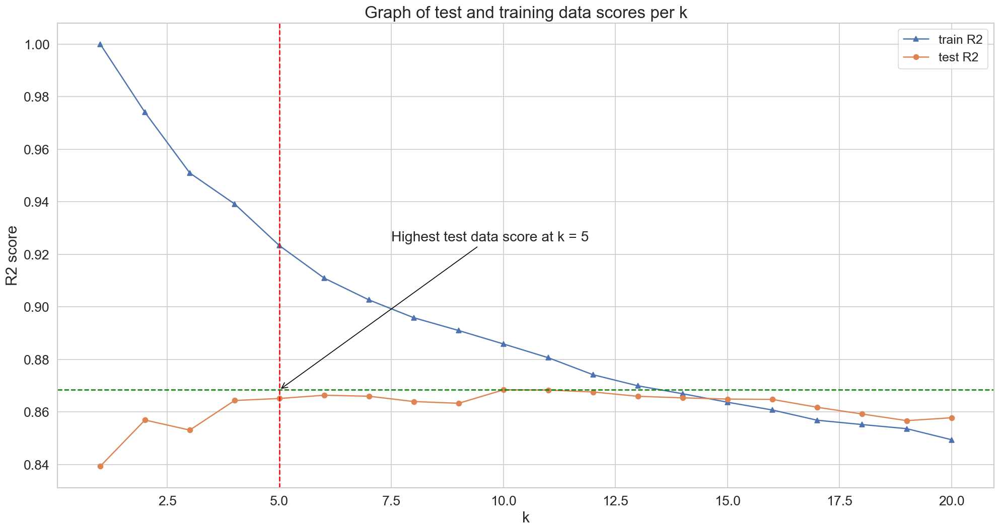

In [269]:
plt.figure(figsize=(20, 10), dpi=120)
plt.plot(range(1, 21), train_scores, label="train R2", marker="^")
plt.plot(range(1, 21), test_scores, label="test R2", marker="o")
plt.title(label="Graph of test and training data scores per k", fontsize=20)
plt.xlabel("k", fontsize=18)
plt.ylabel("R2 score", fontsize=18)
plt.tick_params(axis="both", labelsize=16)
plt.legend(title_fontsize=17, fontsize=15)
plt.axhline(y=max(test_scores), color="green", linestyle="--")
plt.axvline(x=5, color="red", linestyle="--")
plt.annotate(
    text="Highest test data score at k = 5",
    xy=(5, max(test_scores)),
    xytext=(7.5, 0.925),
    arrowprops={"arrowstyle":"->", "color":"black"},
    fontsize = 17
)
plt.show()

In [270]:
params_KNeighbors = {
    "model__n_neighbors":range(3, 20, 2),
    "model__weights":["uniform", "distance"],
    "model__p": [1, 2],
    "model__metric": ['minkowski', 'euclidean', 'manhattan']
}

In [271]:
scoring = {
    'r2': 'r2',               
    'neg_mse': 'neg_mean_squared_error',      
    'neg_mae': 'neg_mean_absolute_error',     
    'neg_rmse': 'neg_root_mean_squared_error',
}

In [272]:
GridSearch = GridSearchCV(
    pipline_KNeighbors,
    params_KNeighbors,
    scoring=scoring,
    refit="r2",
    cv=5,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [273]:
GridSearch.fit(x_train, y_train.ravel())

Fitting 5 folds for each of 108 candidates, totalling 540 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...ighbors=20))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'model__metric': ['minkowski', 'euclidean', ...], 'model__n_neighbors': range(3, 20, 2), 'model__p': [1, 2], 'model__weights': ['uniform', 'distance']}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion <scoring_api_overview>` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.","{'neg_mae': 'neg_mean_absolute_error', 'neg_mse': 'neg_mean_squared_error', 'neg_rmse': 'neg_root_mean_squared_error', 'r2': 'r2'}"
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example<sphx_glr_auto_examples_model_selection_plot_grid_search_refit_callable.py>`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",'r2'
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- an iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide <cross_validation>` for 

In [274]:
print(f"best parameter: {GridSearch.best_params_}")

best parameter: {'model__metric': 'minkowski', 'model__n_neighbors': 3, 'model__p': 1, 'model__weights': 'distance'}


In [275]:
print(f"best score: {GridSearch.best_score_}")

best score: 0.8949308929267266


In [276]:
params = {
    "model__metric": "minkowski",
    "model__n_neighbors": 5,
    "model__p": 1,
    "model__weights": "distance",
}

In [277]:
pipline_KNeighbors.set_params(**params)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [278]:
pipline_KNeighbors.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [279]:
y_pred = pipline_KNeighbors.predict(x_test)

In [280]:
print(f"train score: {pipline_KNeighbors.score(x_train, y_train.ravel())}")
print(f"test score: {pipline_KNeighbors.score(x_test, y_test.ravel())}")

train score: 1.0
test score: 0.8854903739735862


In [281]:
df2 = x_test.copy(deep=True)

In [282]:
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)

In [283]:
df2.sort_values(by="premium", inplace=True)

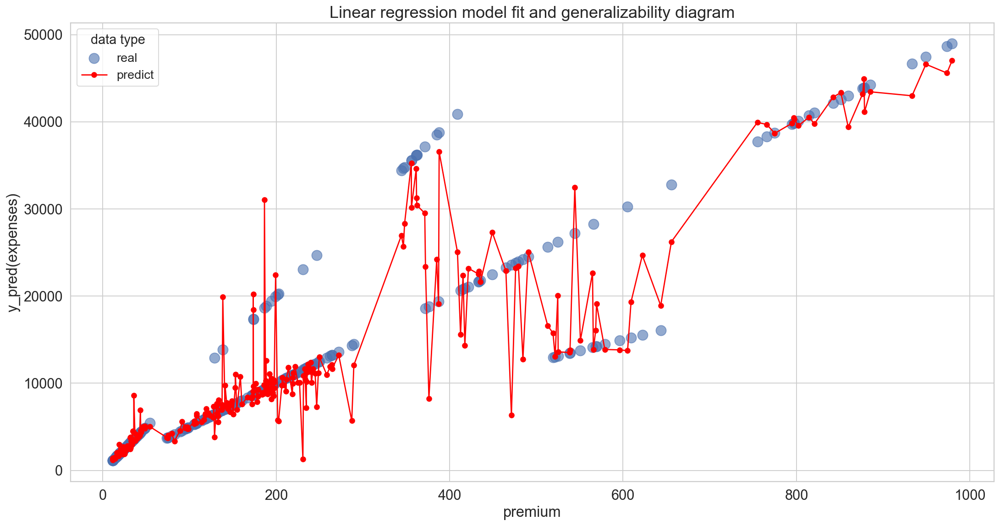

In [284]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(x=df2["premium"], y=df2["y_test"], s=150, label="real", alpha=0.6)
plt.plot(df2["premium"], df2["y_pred"], label="predict", color="red", marker="o")
plt.title(
    label="Linear regression model fit and generalizability diagram", fontsize=20
)
plt.xlabel("premium", fontsize=18)
plt.ylabel("y_pred(expenses)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

#### ☑️ Summary

---

📌 The knn model was weak in generalization, so we will discard it.


#### Dts regressor

In [285]:
pipline_dts = Pipeline([
    ('scaler', StandardScaler()),
    ('model', (DecisionTreeRegressor(random_state=42)))
])

In [286]:
pipline_dts.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [287]:
y_pred = pipline_dts.predict(x_test)

In [288]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 78.758653846154
mean_squared_error: 40254.3605673077
root_mean_squared_error: 200.6348936932649
r2 score: 0.9997209790448442


In [289]:
print(f"train score: {pipline_dts.score(x_train, y_train.ravel())}")
print(f"test score: {pipline_dts.score(x_test, y_test.ravel())}")

train score: 1.0
test score: 0.9997209790448442


**⚠️ overfit**

In [290]:
params_dts = {
    "model__criterion":["absolute_error", "friedman_mse", "poisson", "squared_error"],
    "model__splitter":["best", "random"],
    "model__max_depth": range(2, 10),
    "model__min_samples_split": range(2, 10),
    
}

In [291]:
GridSearch = GridSearchCV(
    pipline_dts,
    params_dts,
    scoring=scoring,
    refit="r2",
    cv=5,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [292]:
GridSearch.fit(x_train, y_train.ravel())

Fitting 5 folds for each of 512 candidates, totalling 2560 fits


c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:489: FitFailedWarning: 
640 fits failed out of a total of 2560.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
66 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 851, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1403, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\hosse\App

,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...m_state=42))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'model__criterion': ['absolute_error', 'friedman_mse', ...], 'model__max_depth': range(2, 10), 'model__min_samples_split': range(2, 10), 'model__splitter': ['best', 'random']}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion <scoring_api_overview>` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.","{'neg_mae': 'neg_mean_absolute_error', 'neg_mse': 'neg_mean_squared_error', 'neg_rmse': 'neg_root_mean_squared_error', 'r2': 'r2'}"
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example<sphx_glr_auto_examples_model_selection_plot_grid_search_refit_callable.py>`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",'r2'
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- an iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide 

In [293]:
print(f"best parameter: {GridSearch.best_params_}")

best parameter: {'model__criterion': 'absolute_error', 'model__max_depth': 9, 'model__min_samples_split': 3, 'model__splitter': 'best'}


In [294]:
print(f"best score: {GridSearch.best_score_}")

best score: 0.9940112143118393


In [295]:
params = {
    "model__criterion": "absolute_error",
    "model__max_depth": 4,
    "model__min_samples_split": 3,
    "model__splitter": "best",
}
pipline_dts.set_params(**params)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [296]:
pipline_dts.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [297]:
y_pred = pipline_dts.predict(x_test)

In [298]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 944.8651346153846
mean_squared_error: 2309851.5293322112
root_mean_squared_error: 1519.8195713084535
r2 score: 0.9839893872142236


In [299]:
print(f"train score: {pipline_dts.score(x_train, y_train.ravel())}")
print(f"test score: {pipline_dts.score(x_test, y_test.ravel())}")

train score: 0.9812375238954354
test score: 0.9839893872142236


✅

In [300]:
df2 = x_test.copy(deep=True)
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)
df2.sort_values(by="premium", inplace=True)

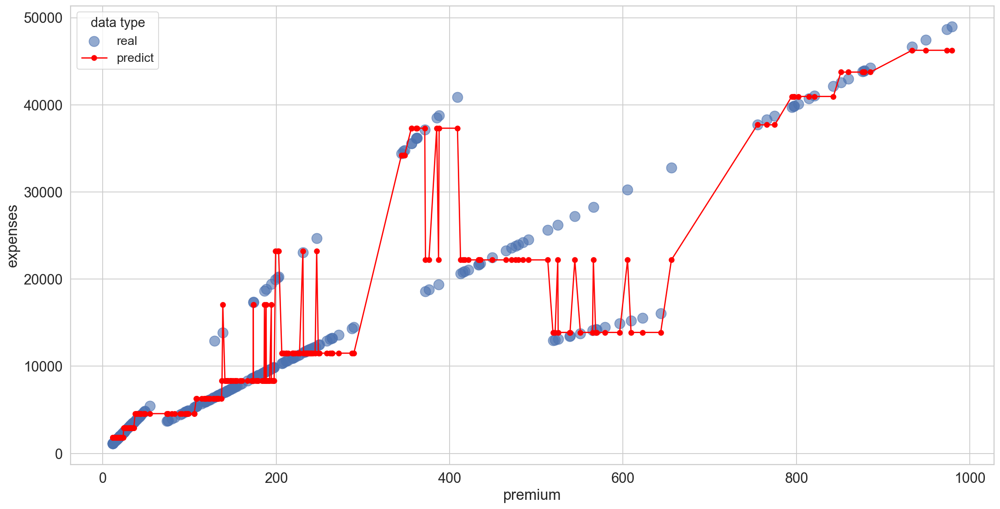

In [301]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(
    x=df2["premium"], y=df2["y_test"], s=150, label="real", alpha=0.6
)
plt.plot(df2["premium"], df2["y_pred"], label="predict", color="red", marker="o")
plt.xlabel("premium", fontsize=18)
plt.ylabel("expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

In [302]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(pipline_dts, x, y.ravel(), cv=5, scoring="r2")
print(f"mean: {scores.mean()}")
print(f"std: {scores.std()}")

mean: 0.9768630687640799
std: 0.006600479701767071


#### ☑️ summary


---
📌 The tree model delivered excellent generalizability with a well-structured setup.

#### Random forest regressor

In [303]:
pipline_rf = Pipeline([
    ('scaler', StandardScaler()),
    ('model', (RandomForestRegressor(random_state=42, n_jobs=-1)))
])

In [304]:
pipline_rf.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [305]:
y_pred = pipline_rf.predict(x_test)

In [306]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 96.41485884615382
mean_squared_error: 201887.04079120676
root_mean_squared_error: 449.31841804137827
r2 score: 0.9986006307351241


In [307]:
df2 = x_test.copy(deep=True)
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)
df2.sort_values(by="premium", inplace=True)

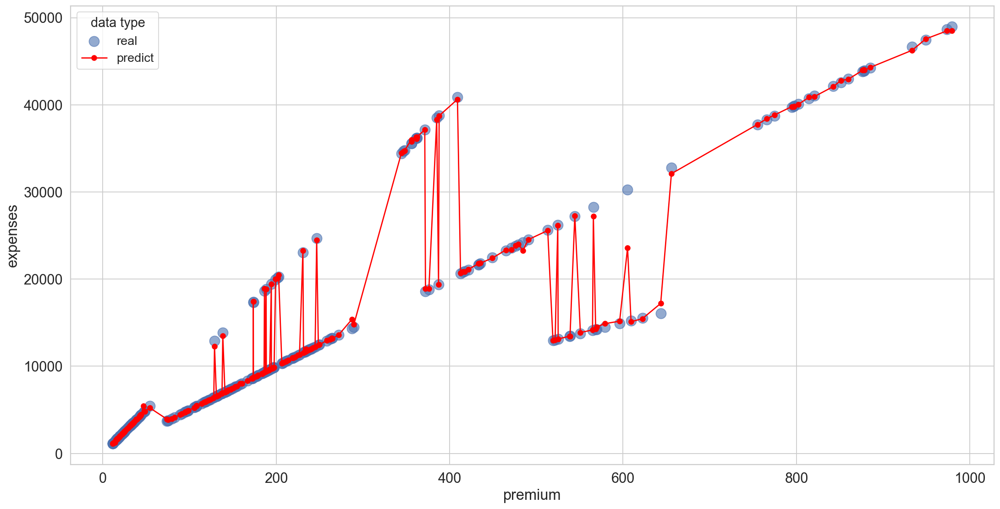

In [308]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(
    x=df2["premium"], y=df2["y_test"], s=150, label="real", alpha=0.6
)
plt.plot(df2["premium"], df2["y_pred"], label="predict", color="red", marker="o")
plt.xlabel("premium", fontsize=18)
plt.ylabel("expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

In [309]:
print(f"train score: {pipline_rf.score(x_train, y_train.ravel())}")
print(f"test score: {pipline_rf.score(x_test, y_test.ravel())}")

train score: 0.9992737226703851
test score: 0.9986006307351241


In [310]:
scores = cross_val_score(pipline_rf, x, y.ravel(), cv=5, scoring="r2")
print(f"mean: {scores.mean()}")
print(f"std: {scores.std()}")

mean: 0.9978513054195641
std: 0.000609157889470747


In [311]:
from sklearn.model_selection import cross_validate

scores = cross_validate(
    pipline_rf,
    x,
    y.ravel(),
    cv=5,
    scoring=["r2", "neg_mean_absolute_error", "neg_root_mean_squared_error"]
)

scores


{'fit_time': array([0.09294105, 0.09541941, 0.09271741, 0.09364128, 0.08617973]),
 'score_time': array([0.03033638, 0.01824188, 0.01876545, 0.01826215, 0.01827335]),
 'test_r2': array([0.9976881 , 0.99710136, 0.99858135, 0.99854143, 0.99734428]),
 'test_neg_mean_absolute_error': array([-129.84703308, -130.56198692,  -96.65390077, -100.55650731,
        -153.69759577]),
 'test_neg_root_mean_squared_error': array([-552.9993389 , -569.62871202, -417.42404943, -448.85691839,
        -558.40762883])}

#### ☑️ summary

---
📌 The Random Forest regressor achieved an average R² of approximately 0.998 in 5-fold cross-validation, with very low variance across folds. The MAE and RMSE values are small relative to the target scale, indicating high prediction accuracy and strong generalization performance.

In [312]:
import joblib

In [313]:
joblib.dump(pipline_rf, "pipeline_expenses.joblib")

['pipeline_expenses.joblib']

#### SVR

In [314]:
pipline_svm = Pipeline([
    ('scaler', StandardScaler()),
    ('model', (SVR()))
])

In [315]:
pipline_svm.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [316]:
y_pred = pipline_svm.predict(x_test)

In [317]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 8356.110071706278
mean_squared_error: 161320968.45045045
root_mean_squared_error: 12701.2191718138
r2 score: -0.11818769617341429


In [318]:
params_svm = {
    "model__kernel":["linear", "rbf", "poly", "sigmoid"],
    "model__C":range(2, 20),
    "model__epsilon":[0.001, 0.001, 0.1, 1],
}

In [319]:
GridSearch = GridSearchCV(
    pipline_svm,
    params_svm,
    cv=5,
    refit="r2",
    scoring=scoring,
    n_jobs=-1,
    verbose=1,
    return_train_score=True,
)

In [320]:
GridSearch.fit(x_train, y_train.ravel())

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.","Pipeline(step...del', SVR())])"
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'model__C': range(2, 20), 'model__epsilon': [0.001, 0.001, ...], 'model__kernel': ['linear', 'rbf', ...]}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion <scoring_api_overview>` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.","{'neg_mae': 'neg_mean_absolute_error', 'neg_mse': 'neg_mean_squared_error', 'neg_rmse': 'neg_root_mean_squared_error', 'r2': 'r2'}"
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example<sphx_glr_auto_examples_model_selection_plot_grid_search_refit_callable.py>`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",'r2'
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- an iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide <cross_validation>` for the variouscross-validation strategies that 

In [321]:
print(f"best score: {GridSearch.best_score_}")

best score: 0.7566908534883294


In [322]:
print(f"best parameter: {GridSearch.best_params_}")

best parameter: {'model__C': 19, 'model__epsilon': 1, 'model__kernel': 'linear'}


In [323]:
params = {"model__C": 19, "model__epsilon": 1, "model__kernel": "linear"}
pipline_svm.set_params(**params)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [324]:
pipline_svm.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [325]:
y_pred = pipline_svm.predict(x_test)

In [326]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 2900.134085561655
mean_squared_error: 30915152.393204764
root_mean_squared_error: 5560.139601952883
r2 score: 0.7857132686255509


In [327]:
df2 = x_test.copy(deep=True)
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)
df2.sort_values(by="premium", inplace=True)

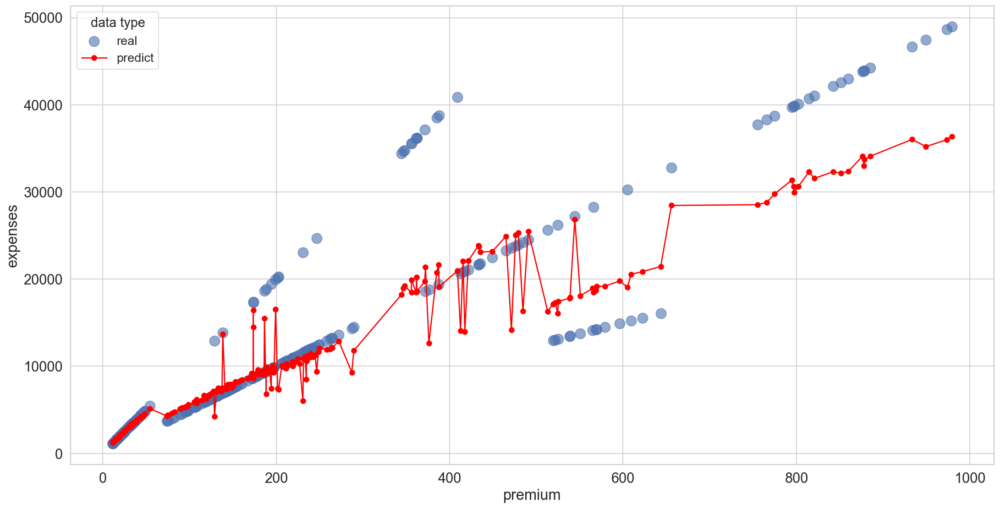

In [328]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(
    x=df2["premium"], y=df2["y_test"], s=150, label="real", alpha=0.6
)
plt.plot(df2["premium"], df2["y_pred"], label="predict", color="red", marker="o")
plt.xlabel("premium", fontsize=18)
plt.ylabel("expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

#### ☑️ summary


---
📌 The SVR model failed to provide adequate generalizability,
We will discard this model.

#### LGBMRegressor

In [329]:
pipline_LGBM = Pipeline([
    ('scaler', StandardScaler()),
    ('model', (LGBMRegressor(random_state=42, n_jobs=-1)))
])

In [330]:
pipline_LGBM.fit(x_train, y_train.ravel())

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 517
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] Start training from score 12341.387482


,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [331]:
y_pred = pipline_LGBM.predict(x_test)

c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


In [332]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 201.3630196390245
mean_squared_error: 174481.853552243
root_mean_squared_error: 417.71025071482626
r2 score: 0.9987905883300745


In [333]:
df2 = x_test.copy(deep=True)
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)
df2.sort_values(by="premium", inplace=True)

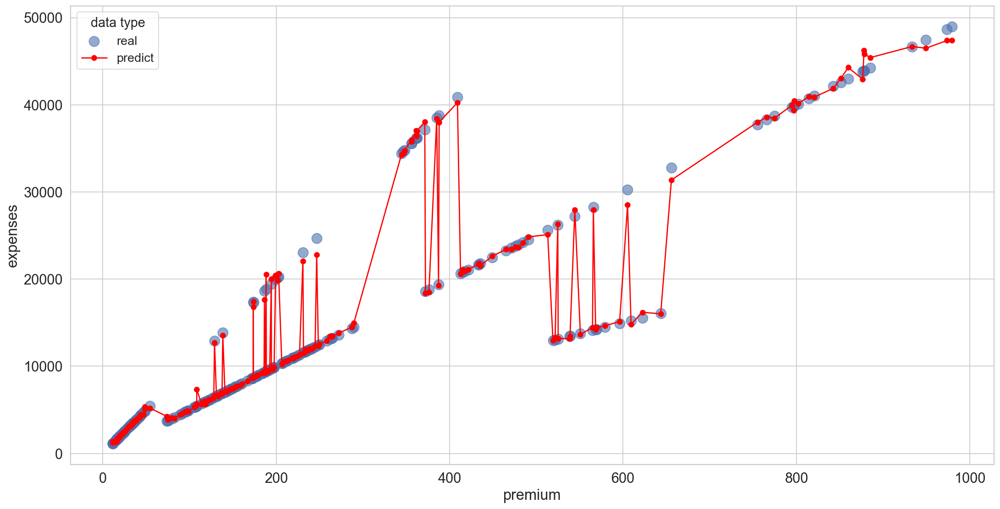

In [334]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(
    x=df2["premium"], y=df2["y_test"], s=150, label="real", alpha=0.6
)
plt.plot(df2["premium"], df2["y_pred"], label="predict", color="red", marker="o")
plt.xlabel("premium", fontsize=18)
plt.ylabel("expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

In [335]:
print(pipline_LGBM.score(x_train, y_train.ravel()))
print(pipline_LGBM.score(x_test, y_test.ravel()))

0.9991252637697818
0.9987905883300745


c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


In [336]:
scores = cross_val_score(pipline_LGBM, x, y.ravel(), cv=5, scoring="r2")
print(f"mean: {scores.mean()}")
print(f"std: {scores.std()}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] Start training from score 12472.601347


c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] Start training from score 12570.419206
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 524
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] Start training from score 12611.417587


c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 518
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] Start training from score 12390.241952
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] Start training from score 12530.596509
mean: 0.9976508488129875
std: 0.0005065402403880929


c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


**⚠️overfit**

In [337]:
params_hard = {
    "model__max_depth": 4,           
    "model__num_leaves": 15,         
    "model__learning_rate": 0.03,    
    "model__n_estimators": 700,     
    "model__min_child_samples": 50,  
    "model__subsample": 0.7,         
    "model__colsample_bytree": 0.7,  
    "model__reg_alpha": 1.5,         
    "model__reg_lambda": 0.7,        
}

pipline_LGBM.set_params(**params)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [338]:
pipline_LGBM.fit(x_train, y_train.ravel())

[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: epsilon
[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: epsilon
[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 517
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] Start training from score 12341.387482


,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [339]:
y_pred = pipline_LGBM.predict(x_test)

[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: epsilon
[LightGBM] [Warning] Unknown parameter: kernel


c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


In [340]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 201.3630196390245
mean_squared_error: 174481.853552243
root_mean_squared_error: 417.71025071482626
r2 score: 0.9987905883300745


In [341]:
df2 = x_test.copy(deep=True)
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)
df2.sort_values(by="premium", inplace=True)

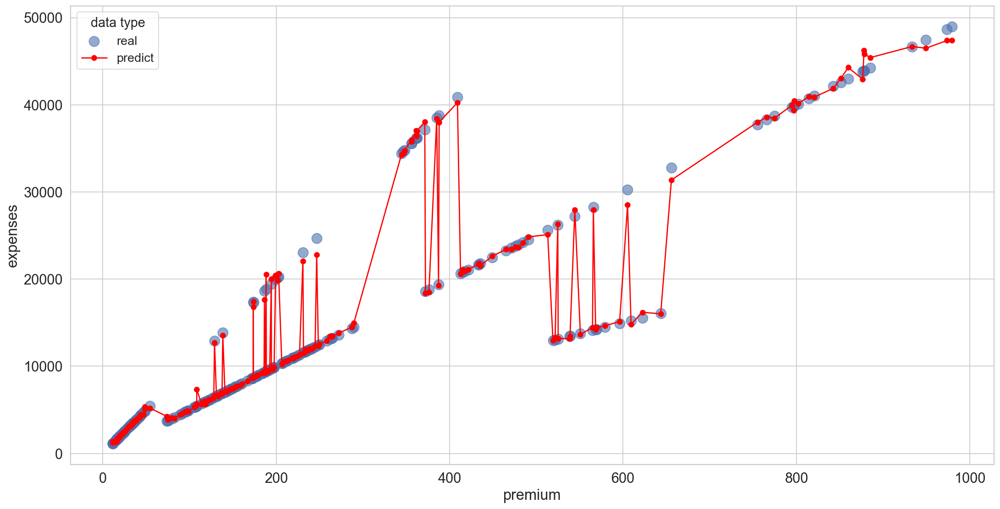

In [342]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(
    x=df2["premium"], y=df2["y_test"], s=150, label="real", alpha=0.6
)
plt.plot(df2["premium"], df2["y_pred"], label="predict", color="red", marker="o")
plt.xlabel("premium", fontsize=18)
plt.ylabel("expenses", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

In [343]:
print(pipline_LGBM.score(x_train, y_train.ravel()))
print(pipline_LGBM.score(x_test, y_test.ravel()))

[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: epsilon
[LightGBM] [Warning] Unknown parameter: kernel
0.9991252637697818
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: epsilon
[LightGBM] [Warning] Unknown parameter: kernel
0.9987905883300745


c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\hosse\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


LGBM model is off-fitted.

We will also discard this model.

#### premium Target

In [344]:
x = df.drop(columns="premium")
y = df["premium"].values.reshape(-1, 1)

In [345]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42, test_size=0.2)

In [346]:
pipline_dts.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [347]:
y_pred = pipline_dts.predict(x_test)

In [348]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 19.73449365384615
mean_squared_error: 1491.0998864972214
root_mean_squared_error: 38.614762546171654
r2 score: 0.9729379074058924


In [349]:
pipline_dts.score(x_train, y_train.ravel())

0.9595640489053315

In [350]:
pipline_dts.score(x_test, y_test.ravel())

0.9729379074058924

In [351]:
df2 = x_test.copy(deep=True)
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)
df2.sort_values(by="expenses", inplace=True)

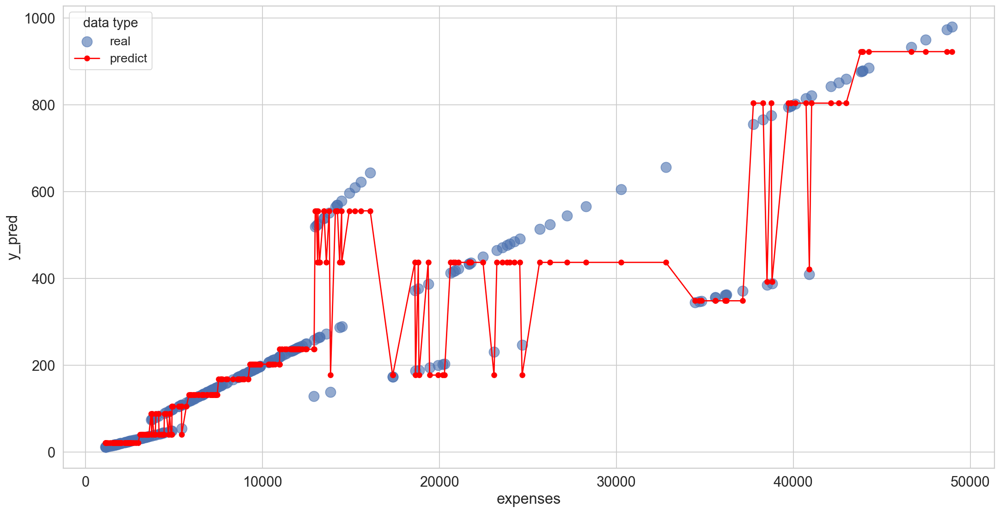

In [352]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(
    x=df2["expenses"], y=df2["y_test"], s=150, label="real", alpha=0.6
)
plt.plot(df2["expenses"], df2["y_pred"], label="predict", color="red", marker="o")
plt.xlabel("expenses", fontsize=18)
plt.ylabel("y_pred", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

In [353]:
scores = cross_val_score(pipline_dts, x, y.ravel(), cv=5, scoring="r2")
print(f"mean: {scores.mean()}")
print(f"std: {scores.std()}")

mean: 0.946552808260915
std: 0.013989394780440296


In [354]:
pipline_rf.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['age','gender','bmi',...,'region_northwest','region_southeast', 'region_southwest']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
Name,Type,Value


In [355]:
y_pred = pipline_rf.predict(x_test)

In [356]:
print(f"mean_absolute_error: {metrics.mean_absolute_error(y_test, y_pred)}")
print(f"mean_squared_error: {metrics.mean_squared_error(y_test, y_pred)}")
print(f"root_mean_squared_error: {metrics.root_mean_squared_error(y_test, y_pred)}")
print(f"r2 score: {metrics.r2_score(y_test, y_pred)}")

mean_absolute_error: 1.582975319230762
mean_squared_error: 57.307768241767256
root_mean_squared_error: 7.570189445566554
r2 score: 0.9989599166732126


In [357]:
pipline_rf.score(x_train, y_train.ravel())

0.9995249157766991

In [358]:
pipline_rf.score(x_test, y_test.ravel())

0.9989599166732126

In [359]:
scores = cross_val_score(pipline_rf, x, y.ravel(), cv=5, scoring="r2")
print(f"mean: {scores.mean()}")
print(f"std: {scores.std()}")

mean: 0.9951289475367805
std: 0.006908837669582032


In [360]:
df2 = x_test.copy(deep=True)
df2.insert(10, "y_test", y_test)
df2.insert(11, "y_pred", y_pred)
df2.sort_values(by="expenses", inplace=True)

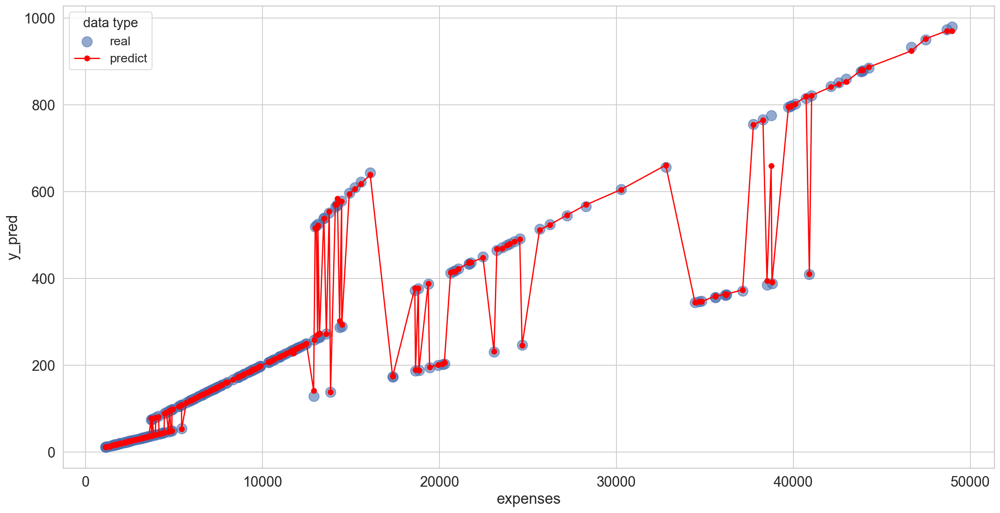

In [361]:
plt.figure(figsize=(20, 10), dpi=130)
plt.scatter(
    x=df2["expenses"], y=df2["y_test"], s=150, label="real", alpha=0.6
)
plt.plot(df2["expenses"], df2["y_pred"], label="predict", color="red", marker="o")
plt.xlabel("expenses", fontsize=18)
plt.ylabel("y_pred", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.legend(title="data type", loc="best", title_fontsize=16, fontsize=15)
plt.show()

In [362]:
joblib.dump(pipline_rf, "pipeline_premium.joblib")

['pipeline_premium.joblib']